In [17]:
# Imports

import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from sklearn.manifold import MDS
from sklearn import metrics
import hdbscan
from PIL import Image
import os
import pingouin as pg
import seaborn as sns
from scipy.spatial.distance import pdist, squareform
from scipy.linalg import orthogonal_procrustes
import pprint

import glob
import re

import rpy2.robjects as ro
from rpy2.robjects.packages import importr
from rpy2.robjects import pandas2ri, StrVector

rstatix = importr("rstatix")

import json
import gc

import ecoset
import categorization as cat
import train
import utils

In [19]:
# Seed for reproducibility
np.random.seed(2023)
tf.random.set_seed(2023)
rng = np.random.default_rng()

overwrite = False

# Within level cluster indices
within_level_cluster = True

In [21]:
def find_optimal_cut_level(
    clusterer: hdbscan.hdbscan_,
    img_info: pd.DataFrame,
    noise_label: int = -1,
    verbose: bool = False,
):
    """
    Find the optimal cut levels for the superordinate, basic, and subordinate
    levels from img_info based on noise penalized adjusted rand index.
    """
    # Get cut locations from condensed tree
    tree = clusterer.condensed_tree_.to_pandas()
    cutLocs = tree.loc[tree["child_size"] > clusterer.min_cluster_size][
        "lambda_val"
    ].unique()

    levels = ["super", "basic", "sub"]
    cutInfo = pd.DataFrame(columns=["level", "cut", "nClusters", "npARI"])
    for level in levels:
        for cut in cutLocs:
            clusters = clusterer.single_linkage_tree_.get_clusters(
                1 / cut, clusterer.min_cluster_size
            )
            ari = cat.npARI(img_info[level], np.array(clusters))

            # Remove noise category to save info
            clusters = [x for x in clusters if x != noise_label]

            # Save info
            cutInfo = pd.concat(
                [
                    cutInfo,
                    pd.DataFrame(
                        {
                            "level": [level],
                            "cut": [cut],
                            "nClusters": [len(np.unique(clusters))],
                            "npARI": [ari],
                        }
                    ),
                ],
                axis=0,
            )

        # Print optimal cut if needed
        if verbose:
            if len(cutInfo) == 0:
                print(f"No clusters found for {level} level.")
                continue

            optimalCut = (
                cutInfo.loc[cutInfo["level"] == level]
                .sort_values("npARI", ascending=False)
                .iloc[0]
            )

            print(
                f"Optimal cut for {level} level is at {optimalCut['cut']} with {optimalCut['nClusters']} clusters and a npARI of {optimalCut['npARI']}."
            )

    return cutInfo

In [23]:
def simulate_task(
    imgInfo: pd.DataFrame,
    *,
    rng: np.random.Generator,
    exemplars: np.ndarray = None,
    centroids: np.ndarray = None,
    balanced: bool = True,
    nreps: int = 100,
    foils: bool = False,
    exemplar_kwargs: dict = {},
    ebrw_kwargs: dict = {},
) -> pd.DataFrame:
    """
    Return results from simulating the category verification task.

    Parameters
    ----------
    imgInfo : pd.DataFrame
        A dataframe with at least the columns "super", "basic", "sub", "set". If
        "image" is present, it will be used to label the images in the task,
        otherwise, representations are assumed to be simulated.
    rng: np.random.Generator
        A numpy random number generator, passed along to any functions needing
        the RNG.
    exemplars : np.ndarray, optional
        A 2D array of shape (nImages, nFeatures) with the exemplars.
    centroids : np.ndarray, optional
        A 2D array of shape (nCategories, nFeatures) with the centroids.
    balanced : bool, optional
        Whether to balance the memory exemplars across levels.
    nreps : int, optional
        The number of representations for the target (and foil) category in
        memory at each level.
    foils : bool, optional
        Whether to include foils in the task.
    exemplar_kwargs : dict, optional
        Keyword arguments to pass to the exemplar_maker function.
    ebrw_kwargs : dict, optional
        Keyword arguments to pass to the EBRW model.

    Returns
    -------
    pd.DataFrame
        A dataframe with columns "image", "category", "level", "response", "RT",
        containing the simulated task results.
    """

    def _bootstrapReps(reps, repIdxs, subs):
        # Bootstraps representations based on subordinates
        nSim = int(nreps / len(subs))
        if nSim % 1 != 0:
            raise ValueError(
                "nreps must be divisible by the number of subordinates at every level"
            )
        else:
            nSim = int(nSim)

        bootInfo = imgInfo.loc[repIdxs].reset_index(drop=True)

        bootReps = []
        for sub in subs:
            # Get representations for the subordinates
            subIdxs = bootInfo[bootInfo["sub"] == sub].index
            subReps = reps[subIdxs]

            # Bootstrap the representations
            bootReps += [rng.choice(subReps, size=nSim, replace=True)]

        return np.concatenate(bootReps, axis=0)

    if (exemplars is not None and centroids is not None) or (
        exemplars is None and centroids is None
    ):
        raise ValueError("Either exemplars or centroids must be provided")
    else:  # Temporary measure to make highlighting work
        _ = 1 + 1

    if centroids is not None:
        # Check if imgInfo has the right subordinate category labels
        subs = imgInfo["sub"].unique()
        if not np.all(np.array(range(len(centroids))) == subs):
            raise ValueError("Centroids do not match the subordinate category labels")

    # Figure out how many exemplars are in memory
    nMemory = len(imgInfo.loc[imgInfo["set"] == "train"])

    # Setup dataframe
    performance = pd.DataFrame(columns=["image", "category", "level", "response", "RT"])

    # Loop through levels
    levels = ["super", "basic", "sub"]
    for i, level in enumerate(levels):
        # Get categories at this level
        cats = imgInfo[level].unique()

        # Loop through categories
        for category in cats:
            if exemplars is not None:
                # Find the test exemplars for this category
                testIdxs = imgInfo.loc[
                    (imgInfo[level] == category) & (imgInfo["set"] == "test")
                ].index
                testReps = exemplars[testIdxs]

                # Find the memory exemplars for this category
                memoryIdxs = imgInfo.loc[
                    (imgInfo[level] == category) & (imgInfo["set"] == "train")
                ].index
                memoryReps = exemplars[memoryIdxs]
                memoryLabels = np.zeros(len(memoryReps))

                if foils:  # EBRW task with foils
                    foilIdx = imgInfo.loc[
                        (imgInfo[level] != category) & (imgInfo["set"] == "train")
                    ].index

                    # Only keep the foils with the same parent category
                    if level != "super":  # Keep all for super
                        parentLevel = levels[levels.index(level) - 1]
                        parentCat = imgInfo.iloc[memoryIdxs[0]][parentLevel]
                        validIdxs = imgInfo.loc[imgInfo[parentLevel] == parentCat].index

                        # Only keep foilIDxs in validIdxs
                        foilIdx = [x for x in foilIdx if x in validIdxs]

                    foilReps = exemplars[foilIdx]
                    foilLabels = np.ones(len(foilReps))

                if balanced:
                    # Split the memory representations by subordinate category
                    memorySubs = imgInfo.loc[memoryIdxs, "sub"].unique()

                    memoryReps = _bootstrapReps(memoryReps, memoryIdxs, memorySubs)
                    memoryLabels = np.zeros(len(memoryReps))

                    if foils:
                        # Split the foil representations by subordinate category
                        foilSubs = imgInfo.loc[foilIdx, "sub"].unique()

                        foilReps = _bootstrapReps(foilReps, foilIdx, foilSubs)
                        foilLabels = np.ones(len(foilReps))

                if foils:
                    memoryReps = np.concatenate([memoryReps, foilReps], axis=0)
                    memoryLabels = np.concatenate([memoryLabels, foilLabels], axis=0)
            else:  # Using centroids to create balanced levels
                if balanced:
                    Warning("balanced argument has no effect on centroids.")

                # Find the subordinates for this category
                subs = imgInfo.loc[imgInfo[level] == category, "sub"].unique()
                nSims = int(nreps / len(subs))

                if nSims % 1 != 0:
                    raise ValueError(
                        "nreps must be divisible by the number of subordinates at every level"
                    )

                # Simulate some reps from each centroid
                testReps = np.concatenate(
                    [
                        cat.exemplar_maker(nSims, centroids[sub], **exemplar_kwargs)
                        for sub in subs
                    ],
                    axis=0,
                )
                memoryReps = np.concatenate(
                    [
                        cat.exemplar_maker(nSims, centroids[sub], **exemplar_kwargs)
                        for sub in subs
                    ],
                    axis=0,
                )
                memoryLabels = np.zeros(len(memoryReps))

                # Make foils if necessary
                if foils:
                    # Find the subordinates for the foils
                    foilSubs = imgInfo.loc[imgInfo[level] != category, "sub"].unique()

                    # Only keep the foils with the same parent category
                    if level != "super":
                        parentLevel = levels[levels.index(level) - 1]
                        parentCat = imgInfo.loc[imgInfo["sub"] == subs[0]][
                            parentLevel
                        ].iloc[0]
                        foilSubs = [
                            sub
                            for sub in foilSubs
                            if imgInfo[parentLevel].loc[imgInfo["sub"] == sub].iloc[0]
                            == parentCat
                        ]

                    # Make representations
                    foilReps = np.concatenate(
                        [
                            cat.exemplar_maker(nSims, centroids[sub], **exemplar_kwargs)
                            for sub in foilSubs
                        ],
                        axis=0,
                    )
                    foilLabels = np.ones(len(foilReps))

                    # Combine foils with memory
                    memoryReps = np.concatenate([memoryReps, foilReps], axis=0)
                    memoryLabels = np.concatenate([memoryLabels, foilLabels], axis=0)

            # Handle the possibility of lists in kwargs
            _ebrwKwargs = {}
            for key, value in ebrw_kwargs.items():
                if isinstance(value, list):
                    _ebrwKwargs[key] = value[i]
                else:
                    _ebrwKwargs[key] = value
            ebrw = cat.EBRW(
                memory_reps=memoryReps,
                memory_categories=memoryLabels,
                memory_strengths=np.ones(len(memoryReps)) * (1 / nMemory),
                rng=rng,
                **_ebrwKwargs,
            )

            decisions, rts = ebrw.categorize(
                probes=testReps, categories=np.zeros(len(testReps))
            )

            # Check if images have names
            if "image" in imgInfo.columns:
                imageNames = imgInfo.loc[testIdxs, "image"]
            else:
                imageNames = "simulated"

            tmp = pd.DataFrame(
                {
                    "image": imageNames,
                    "category": [category] * len(testReps),
                    "level": [level] * len(testReps),
                    "response": ["yes" if x == 0 else "no" for x in decisions],
                    "RT": rts,
                }
            )
            performance = pd.concat([performance, tmp], axis=0)

    return performance

In [25]:
def silhouetteScores(distMat, imgInfo):
    """Calculate silhouette scores for each item at each level"""
    # Setup an array to hold scores for each item across three levels
    scores = np.empty((distMat.shape[0], 3), dtype="float32")

    # Loop through three levels
    levels = ["sub", "basic", "super"]
    meanScores = {}
    for i, level in enumerate(levels):
        if len(imgInfo[level].unique()) < 2:
            continue

        # Calculate and save scores for level
        levelScores = metrics.silhouette_samples(
            distMat, imgInfo[level], metric="precomputed"
        )

        scores[:, i] = levelScores[:]

        # Calculate mean score for the entire level
        meanScores[level] = np.mean(levelScores)

        # Calculate mean score for each category
        cats = imgInfo[level].unique()
        for category in cats:
            # Find the items for this category
            meanScores[f"{level}-{category}"] = np.mean(
                levelScores[imgInfo[level] == category]
            )

    return scores, meanScores

In [27]:
def make_sim_matrix(modelDir, imgInfo, name, overwrite=False):
    imgInfo = imgInfo.sort_values(by=["super", "basic", "sub"])
    imgInfo = imgInfo.reset_index(drop=True)

    # We skip intermediate steps as needed
    repFile = f"./representations/{name}Reps.npy"
    simMatFile = f"./representations/{name}SimMat.npy"

    if not os.path.exists(repFile) or overwrite:
        # Load imgs
        print("Loading images")
        allImgs = []
        for i, row in imgInfo.iterrows():
            img = Image.open(row["path"])
            allImgs += [ecoset.preprocess_alexnet(img)]
        allImgs = np.concatenate(allImgs)

        print("Making representations")
        # Assumes we have 10 models named seeds from 1-10, outputs (5, 5, 4096)
        seeds = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
        reps = np.zeros((len(seeds), len(allImgs), 5, 5, 4096), dtype=np.float32)

        for i, seed in enumerate(seeds):
            # Determine which type of model we are loading
            modelFiles = glob.glob(os.path.join(modelDir, "*"))

            if "training" in modelFiles[0]:
                # Load model
                modelFiles = os.path.join(modelDir, f"training_seed_{seed:02}", "*")
                modelFiles = glob.glob(modelFiles)

                epochs = max(
                    [
                        int(re.search(r"epoch(\d+)", file).group(1))
                        for file in modelFiles
                        if "epoch" in file
                    ]
                )

                weightPath = os.path.join(
                    modelDir, f"training_seed_{seed:02}", f"model.ckpt_epoch{epochs}"
                )
                if "ILSVRC" in modelDir:
                    model = ecoset.make_alex_net_v2(
                        weights_path=weightPath, output_shape=1000
                    )
                else:
                    model = ecoset.make_alex_net_v2(weights_path=weightPath)
            else:
                modelFiles = os.path.join(modelDir, f"seed{seed:02}", "*")
                modelFiles = glob.glob(modelFiles)
                modelFiles = [file for file in modelFiles if "epoch" in file]
                modelFiles.sort()

                try:
                    model = tf.keras.models.load_model(
                        modelFiles[-1],
                        custom_objects={"TwoHotSubAccuracy": train.TwoHotSubAccuracy},
                    )
                except:
                    model = tf.keras.models.load_model(
                        modelFiles[-1],
                        custom_objects={
                            "weighted_cce": tf.keras.losses.CategoricalCrossentropy
                        },
                    )

            # Get activation from penultimate layer
            layer = model.get_layer("fc7")
            model = tf.keras.Model(model.input, layer.output)

            # Get representations
            reps[i] = model.predict(
                allImgs,
            )

            # Cleanup
            del model
            tf.keras.backend.clear_session()
            gc.collect()

        # Save reps
        np.save(repFile, reps)
    else:
        print("Loading representations")
        reps = np.load(repFile)

    # Create similarity matrix
    if not os.path.exists(simMatFile) or overwrite:
        print("Making similarity matrix")
        # Preallocate array for similarity matrices
        simMat = np.zeros((len(seeds), len(allImgs), len(allImgs)), dtype=np.float32)

        # Loop through models
        for i, modelReps in enumerate(reps):
            # Flatten model reps
            modelReps = modelReps.reshape(modelReps.shape[0], -1)

            # Calculate similarity matrix using default GCM
            simMat[i] = cat.default_gcm_sim_mat(modelReps)

        # Save similarity matrices
        np.save(simMatFile, simMat)
    else:
        print("Loading similarity matrix")
        # Load similarity matrices
        simMat = np.load(simMatFile)

    # Average over models
    simMat = np.mean(simMat, axis=0)

    return reps, simMat

In [29]:
def analyze_structure(
    distMat,
    imgInfo,
    name,
    procrustesTarget=None,
    metric=True,
    eps=1e-6,
    overwrite=False,
):
    imgInfo = imgInfo.sort_values(by=["super", "basic", "sub"])
    imgInfo = imgInfo.reset_index(drop=True)

    # Create a heatmap
    heatmapFig, ax = plt.subplots(1, 1, figsize=(9, 9))

    sns.heatmap(
        distMat,
        ax=ax,
        cmap="viridis",
        square=True,
        cbar_kws={"shrink": 0.5},
    )

    # Set a tick once every 40
    _ = ax.set_xticks(np.arange(20, len(imgInfo), 40))
    _ = ax.set_yticks(np.arange(20, len(imgInfo), 40))

    # Edit ticks
    _ = ax.set_xticklabels(
        imgInfo["sub"].iloc[ax.get_xticks()], rotation=40, ha="right"
    )
    _ = ax.set_yticklabels(imgInfo["sub"].iloc[ax.get_yticks()], rotation=0)

    heatmapFig.tight_layout()

    # Show image
    heatmapFig.show()

    # Color mappings for MDS plots
    colorMap = {
        key: sns.color_palette(n_colors=len(imgInfo["basic"].unique()))[i]
        for i, key in enumerate(imgInfo["basic"].unique())
    }

    # Perform clustering
    clusterer = hdbscan.HDBSCAN(
        metric="precomputed",
        min_cluster_size=5,  # Smallest clusters possible
        min_samples=5,  # Conservative-ness of clusters, higher declares more as noise
        cluster_selection_epsilon=0,  # Minimum distance between clusters
        cluster_selection_method="eom",  # Clusters via eom or leaf,
        allow_single_cluster=False,
    ).fit(distMat.astype(np.float64))

    # Get non-negative labels
    clusterLabels = np.unique(clusterer.labels_)
    clusterLabels = clusterLabels[clusterLabels >= 0]

    palette = []
    catUsed = []
    for cluster in clusterLabels:
        # Check what the most common category is
        clusterMembers = imgInfo.loc[clusterer.labels_ == cluster]["basic"]
        category = clusterMembers.value_counts().idxmax()

        # Get the color of the category
        color = colorMap[category]

        # Add category to catUsed
        catUsed += [category]
        # Count how many time this category has been used
        count = catUsed.count(category)

        # Jitter the color
        color = [x + (0.2 * count) for x in color]
        color = tuple([x if x <= 1 else 1 for x in color])

        # Add to palette
        palette += [color]

    palette = sns.color_palette(palette)

    treeFig, ax = plt.subplots(1, 1, figsize=(5, 4))

    _ = clusterer.condensed_tree_.plot(
        select_clusters=True, selection_palette=palette, axis=ax
    )
    treeFig.show()

    _ = find_optimal_cut_level(clusterer, imgInfo, verbose=True)

    # Perform MDS
    # Check if we need MDS
    mdsFile = f"./representations/{name}MDS.npy"
    if not os.path.exists(mdsFile) or overwrite:
        print("Calculating MDS")
        mds = MDS(
            n_components=2,
            dissimilarity="precomputed",
            normalized_stress="auto",
            metric=metric,
            eps=eps,
            n_init=10,
        )

        mdsSolution = mds.fit_transform(distMat)
        print(mds.stress_)

        # Save
        np.save(mdsFile, mdsSolution)
    else:
        print("Loading MDS")
        mdsSolution = np.load(mdsFile)

    # Rotate if needed
    if procrustesTarget is not None:
        R, _ = orthogonal_procrustes(mdsSolution, procrustesTarget)
        mdsSolution = mdsSolution @ R

    # Marker mapping
    markerChoices = ["s", "H", "p", "P", "*"]
    # Go through each basic category and give with of its subordinate a marker
    markerMap = {}
    for basic in imgInfo["basic"].unique():
        # Get the subordinates
        subs = imgInfo.loc[imgInfo["basic"] == basic, "sub"].unique()

        for i, sub in enumerate(subs):
            markerMap[sub] = markerChoices[i]

    # Plot MDS
    mdsFig, ax = plt.subplots(1, 1, figsize=(7, 7))

    # Plot MDS alternate categories
    for i, row in imgInfo.iterrows():
        color = colorMap[row["basic"]]
        marker = markerMap[row["sub"]]
        edgeColor = clusterer.labels_[i]
        edgeColor = palette[edgeColor] if edgeColor >= 0 else (0, 0, 0)

        ax.scatter(
            mdsSolution[i, 0],
            mdsSolution[i, 1],
            s=50,
            color=color,
            marker=marker,
            alpha=0.75,
            edgecolors=edgeColor,
            linewidths=2,
        )

    # Add title
    _ = ax.set_title(f"{name}")

    # Add legend
    legendHandles = [
        mpatches.Patch(color=colorMap[key], label=key) for key in colorMap.keys()
    ]
    legendHandles += [
        mpatches.Patch(color=palette[label], label=f"cluster {label + 1}")
        for label in clusterLabels
    ]
    legendHandles += [mpatches.Patch(color=(0, 0, 0), label="noise")]

    _ = ax.legend(handles=legendHandles, bbox_to_anchor=(1, 1))

    mdsFig.show()

    # Calculate silhouette scores
    _, silScores = silhouetteScores(distMat, imgInfo)

    # For each level of hierarchy, calculate mean scores
    levels = ["super", "basic", "sub"]
    for i, level in enumerate(levels):
        if level not in silScores:
            continue

        print(f"{level}: {silScores[level]}")
        if level == "super":
            cats = imgInfo["super"].unique()
            for category in cats:
                print(f"    {category}: {silScores[f'{level}-{category}']}")
        else:
            # Get average scores per parent category
            parentCats = imgInfo[levels[i - 1]].unique()
            for parentCat in parentCats:
                # Find all categories that belong to the parent
                cats = imgInfo[level].loc[imgInfo[levels[i - 1]] == parentCat].unique()

                # Get the scores
                scores = [silScores[f"{level}-{cat}"] for cat in cats]
                print(f"    {parentCat}: {np.mean(scores)}")

                # Print individual scores
                for cat, score in zip(cats, scores):
                    print(f"        {cat}: {score}")

    return clusterer, mdsSolution, silScores, (heatmapFig, treeFig, mdsFig)

In [31]:
def do_categorization(
    reps, rng, imgInfo, name, balanced, foils, ebrw_kwargs, overwrite=False
):
    imgInfo = imgInfo.sort_values(by=["super", "basic", "sub"])
    imgInfo = imgInfo.reset_index(drop=True)

    # Check if performance file exists
    perfFile = f"./{name}_performance.csv"
    if not os.path.exists(perfFile) or overwrite:
        print("Simulating task")

        # Reshape representations
        reps = reps.reshape(reps.shape[0], reps.shape[1], -1)

        # Preallocate performance dataframe
        performance = pd.DataFrame()
        # Loop through models (assumes 1-10)
        for seed in [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]:
            # Subset ecoset reps for this model
            modelReps = reps[seed - 1]

            # Simulate task
            perf = simulate_task(
                imgInfo,
                rng=rng,
                exemplars=modelReps,
                balanced=balanced,
                foils=foils,
                ebrw_kwargs=ebrw_kwargs,
            )

            # Save to dataframe
            perf["seed"] = seed
            perf["model"] = name
            performance = pd.concat([performance, perf], axis=0)

        # Save performance
        performance.to_csv(perfFile, index=False)
    else:
        print("Loading performance from file")
        performance = pd.read_csv(perfFile)

    performance["level"] = pd.Categorical(
        performance["level"], categories=["super", "basic", "sub"], ordered=True
    )

    # Scale RT to the the 100s
    nDigits = int(np.log10(performance["RT"].mean()) + 1) - 3
    performance["RT"] = performance["RT"] / 10**nDigits

    # Summary
    perfAccSummary = (
        performance.groupby(["model", "seed", "level"])["response"]
        .agg(lambda x: np.mean(x == "yes"))
        .groupby(["level"])
        .agg(["mean", "std"])
    )
    perfRTSummary = (
        performance.groupby(["model", "seed", "level"])["RT"]
        .agg("mean")
        .groupby(["level"])
        .agg(["mean", "std"])
    )

    print(ebrw_kwargs)
    print("Accuracy")
    print(perfAccSummary)
    print("RT")
    print(perfRTSummary)

    # Summarize performance by category
    catAccSummary = (
        performance.groupby(["seed", "category"])["response"]
        .agg(lambda x: np.mean(x == "yes"))
        .groupby(["category"])
        .agg(["mean", "std"])
    )
    catRTSummary = (
        performance.groupby(["seed", "category"])["RT"]
        .agg("mean")
        .groupby(["category"])
        .agg(["mean", "std"])
    )

    # Make the order of categories starting from super,basic,sub
    catOrder = (
        list(imgInfo["super"].unique())
        + list(imgInfo["basic"].unique())
        + list(imgInfo["sub"].unique())
    )
    catAccSummary = catAccSummary.reindex(catOrder)
    catRTSummary = catRTSummary.reindex(catOrder)

    print("Category Accuracy")
    print(catAccSummary)
    print("Category RT")
    print(catRTSummary)

    return performance


def clear_model():
    # Check if model variable exists
    if "model" in globals():
        del globals()["model"]
        tf.keras.backend.clear_session()
        gc.collect()

# Simulated Categorization with EBRW


In [34]:
# Create simulated image info
seeds = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
levels = ["super", "basic", "sub"]

# Make subordinate labels, a new index every 100 images
subLabels = np.repeat(np.arange(8), 100)

# Designate half of the images as test and train, alternating every 50
trainTest = np.concatenate([np.repeat(["train", "test"], 50) for i in range(8)])

# Make basic and super labels
# Every 2 subordinate are the same basic level category
basicLabels = np.repeat(np.arange(4), 200)

# Every 2 basic level categories are the same super level category
superLabels = np.repeat(np.arange(2), 400)

# Stick together labels
simInfo = pd.DataFrame(
    {
        "super": superLabels,
        "basic": basicLabels,
        "sub": subLabels,
        "set": trainTest,
    }
)

In [36]:
# Default subordinate-level category-separation
ebrw_kwargs = {"c": 1, "b": 0.25}

# EBRW file
perfFile = "ebrw_simPerf_subs.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    subSimPerformance = pd.DataFrame()

    for seed in seeds:
        # Simulate categories with subodiante-level category separation
        simReps, _, _ = cat.make_categories(
            cat_rad=1,
            super_rad=1,
            basic_rad=1,
            sub_rad=1,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        # Simulate task
        perf = simulate_task(
            simInfo,
            rng=rng,
            exemplars=simReps,
            balanced=False,
            foils=False,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        subSimPerformance = pd.concat([subSimPerformance, perf], axis=0)

    # Save
    subSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    subSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
subSimPerformance["level"] = pd.Categorical(
    subSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
subSimPerfAccSummary = (
    subSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
subSimPerfRTSummary = (
    subSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(subSimPerfAccSummary)
print(subSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

          mean       std
level                   
super  1.00000  0.000000
basic  0.99825  0.002372
sub    0.98100  0.007091
             mean       std
level                      
super   89.470912  0.005003
basic  264.734198  0.011402
sub    832.248357  0.006421


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4065765547.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4065765547.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subSimPerformance.groupby(["seed", "level"])["RT"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4065765547.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or

We simulated a set of representation with perfect category separation at every level. Then we take this and plug it into a category-verification task.

The task is assumed to be purely about the category being probed (ie: no effect of exemplars from other categories), which means the response is largely dependent on how
close exemplars in memory are to the target and what the criterion for a "yes" response is.

In effect this model demonstrates what would happen if there were perfectly clustered hierarchical representations where every image in memory is labeled at all levels and have category separation all the way down to the subordinate level. On top of this, the category verification task assumes that you can exactly separate the effect of all other exemplars in memory so there's no competition or interference.

We tune EBRW parameters to reach as high accuracy as possible across all three levels.

We see that superordinate level categorie are the fastest, then basic, then subordinate. This is likely due to the fact that superordinate categories have the most exemplars to provide evidence (then basic, then sub).


In [38]:
# Subordinate-level category-separation with high sensitivity
ebrw_kwargs = {"c": 5, "b": 0.25}

# EBRW file
perfFile = "ebrw_simPerf_subsHighSens.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    subHighSensSimPerformance = pd.DataFrame()

    for seed in seeds:
        # Simulate categories with subodiante-level category separation
        simReps, _, _ = cat.make_categories(
            cat_rad=1,
            super_rad=1,
            basic_rad=1,
            sub_rad=1,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        # Simulate task
        perf = simulate_task(
            simInfo,
            rng=rng,
            exemplars=simReps,
            balanced=False,
            foils=False,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        subHighSensSimPerformance = pd.concat([subHighSensSimPerformance, perf], axis=0)

    # Save
    subHighSensSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    subHighSensSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
subHighSensSimPerformance["level"] = pd.Categorical(
    subHighSensSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
subHighSensSimPerfAccSummary = (
    subHighSensSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
subHighSensSimPerfRTSummary = subHighSensSimPerformance.groupby(["model", "level"])[
    "RT"
].agg(["mean", "std"])

print(subHighSensSimPerfAccSummary)
print(subHighSensSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

          mean       std
level                   
super  1.00000  0.000000
basic  0.99475  0.003623
sub    0.96525  0.007212
                        mean       std
model     level                       
simulated super   141.124429  0.638289
          basic   395.321789  1.257283
          sub    1115.388055  0.920044


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/5171730.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subHighSensSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/5171730.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future versio

We repeat the above but with higher sensitivity. One possible way to reconcile the number of exemplars in memory problem is that the higher level categories, despite having more exemplars in memory is that they're really spread out such that with high sensitvity, this matters a lot more.

However, this does not appear to change the pattern of reuslts.


In [40]:
# Default subordinate-level category-separation with normal density
# EBRW on simulated reps
ebrw_kwargs = {"c": 1, "b": 0.25}

# EBRW file
perfFile = "ebrw_simPerf_subsNormal.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    subNormalSimPerformance = pd.DataFrame()

    for seed in seeds:
        # Simulate categories with subordinate-level category-separation
        simReps, _, _ = cat.make_categories(
            cat_rad=1,
            super_rad=1,
            basic_rad=1,
            sub_rad=1,
            nFeatures=1024,
            nImages=100,
            radius_density="normal",
        )

        # Simulate task
        perf = simulate_task(
            simInfo,
            rng=rng,
            exemplars=simReps,
            balanced=False,
            foils=False,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        subNormalSimPerformance = pd.concat([subNormalSimPerformance, perf], axis=0)

    # Save
    subNormalSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    subNormalSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
subNormalSimPerformance["level"] = pd.Categorical(
    subNormalSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
subNormalSimPerfAccSummary = (
    subNormalSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
subNormalSimPerfRTSummary = (
    subNormalSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(subNormalSimPerfAccSummary)
print(subNormalSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

          mean       std
level                   
super  1.00000  0.000000
basic  0.99925  0.001208
sub    0.98150  0.004441
             mean       std
level                      
super   89.202689  0.071713
basic  263.345621  0.283896
sub    824.999119  1.132682


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2950513969.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subNormalSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2950513969.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  subNormalSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2950513969.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain c

Another possibility is that our simulation of categories causes these hollow hyperballs that means that categorization ends up being more like a nearest neighbour task. So we change the simulation parameters to make the category exemplars more likely to appear near the center of categories by manipulating their radii

This does not change the pattern of results.


In [42]:
# No subordinate-level category-separation
# EBRW on simulated reps
ebrw_kwargs = {"c": 1, "b": 0.25}

# EBRW file
perfFile = "ebrw_simPerf_noSubs.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    noSubSimPerformance = pd.DataFrame(
        columns=["model", "image", "category", "level", "response", "RT", "seed"]
    )

    for seed in seeds:
        # Simulate categories with subordinate-level category-separation
        simReps, _, _ = cat.make_categories(
            cat_rad=1,
            super_rad=1,
            basic_rad=1,
            sub_rad=0,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        # Simulate task
        perf = simulate_task(
            simInfo,
            rng=rng,
            exemplars=simReps,
            balanced=False,
            foils=False,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        noSubSimPerformance = pd.concat([noSubSimPerformance, perf], axis=0)

    # Save
    noSubSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    noSubSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
noSubSimPerformance["level"] = pd.Categorical(
    noSubSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
noSubSimPerfAccSummary = (
    noSubSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
noSubSimPerfRTSummary = (
    noSubSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(noSubSimPerfAccSummary)
print(noSubSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2050321732.py:39: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  noSubSimPerformance = pd.concat([noSubSimPerformance, perf], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataF

          mean       std
level                   
super  1.00000  0.000000
basic  0.99875  0.001768
sub    0.98375  0.006038
             mean       std
level                      
super   87.595509  0.002496
basic  257.751971  0.001729
sub    832.242103  0.006157


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2050321732.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  noSubSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2050321732.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future versio

Thus far we've always simulated categories with full category separtion throughout. This is like assuming that a person can easily differentiate exemplars at every level much like an expert. We try removing sub-level categorization.

This doesn't change the results, this is likely due to the level imbalance still.


In [44]:
# Default categories with balanced image counts
# EBRW on simulated reps
ebrw_kwargs = {"c": 1, "b": 0.25}

# EBRW file
perfFile = "ebrw_simPerf_balanced.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    balancedSimPerformance = pd.DataFrame()

    for seed in seeds:
        _, simCentroids, _ = cat.make_categories(
            cat_rad=1,
            super_rad=1,
            basic_rad=1,
            sub_rad=1,
            nFeatures=1024,
            nImages=1,
            radius_density="power",
        )

        perf = simulate_task(
            simInfo,
            rng=rng,
            centroids=simCentroids,
            balanced=True,
            foils=False,
            nreps=100,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        balancedSimPerformance = pd.concat([balancedSimPerformance, perf], axis=0)

    # Save
    balancedSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    balancedSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
balancedSimPerformance["level"] = pd.Categorical(
    balancedSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
balancedSimPerfAccSummary = (
    balancedSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
balancedSimPerfRTSummary = (
    balancedSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(balancedSimPerfAccSummary)
print(balancedSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

         mean       std
level                  
super  0.9985  0.002415
basic  0.9985  0.002687
sub    0.9990  0.001149
             mean       std
level                      
super  265.937047  0.136751
basic  258.342902  0.076420
sub    249.214037  0.098836


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/533232274.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  balancedSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/533232274.py:51: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  balancedSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/533232274.py:57: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain curren

Now we balance the number of exemplars between levels. This removes the number of exemplars as a potential confounding factor to why a basic-level advantage could occur.

Removing this factor doesn't change the pattern of the results. Notably this means that the density of the exemplars at the lower levels is largely the cause of performance difference. Changing the category separation doesn't affect much because only the within-category exemplars matter.


In [46]:
# Default categories on task with foils
ebrw_kwargs = {"c": 3, "b": 0}

# EBRW file
perfFile = "ebrw_simPerf_foils.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    foilSimPerformance = pd.DataFrame()

    for seed in seeds:
        simReps, _, _ = cat.make_categories(
            cat_rad=1,
            super_rad=5,
            basic_rad=5,
            sub_rad=5,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        perf = simulate_task(
            simInfo,
            rng=rng,
            exemplars=simReps,
            balanced=False,
            foils=True,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        foilSimPerformance = pd.concat([foilSimPerformance, perf], axis=0)

    # Save
    foilSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    foilSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
foilSimPerformance["level"] = pd.Categorical(
    foilSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
foilSimPerfAccSummary = (
    foilSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
foilSimPerfRTSummary = (
    foilSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(foilSimPerfAccSummary)
print(foilSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

          mean       std
level                   
super  0.99675  0.002372
basic  0.99900  0.001748
sub    1.00000  0.000000
             mean       std
level                      
super  189.950793  0.143280
basic  251.859430  0.061535
sub    327.718116  0.045296


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2023385552.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2023385552.py:49: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2023385552.py:55: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current beh

We now use a cognitive model that actually uses the foils to make a category-verification decision. Instead of being able to just select the exemplars for the category of interest, your category decision depends whether the target is more similar to the category or a foil category (of the same level and the same parent category).

With this theory of what may be happening during a category-verificaiton test, it's actually the higher level categories that are faster (superordinate). This is owed to the fact that there is still more exemplars for the higher-levels providing evidence to drive faster decisions.


In [48]:
# Simulate categories and perform task with foils and balanced categories
ebrw_kwargs = {"c": 3, "b": 0}

# EBRW file
perfFile = "ebrw_simPerf_balancedFoils.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    foilBalancedSimPerformance = pd.DataFrame()

    for seed in seeds:
        _, simCentroids, _ = cat.make_categories(
            cat_rad=1,
            super_rad=5,
            basic_rad=5,
            sub_rad=5,
            nFeatures=1024,
            nImages=1,
            radius_density="power",
        )

        perf = simulate_task(
            simInfo,
            rng=rng,
            centroids=simCentroids,
            balanced=True,
            foils=True,
            nreps=100,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        foilBalancedSimPerformance = pd.concat(
            [foilBalancedSimPerformance, perf], axis=0
        )

    # Save
    foilBalancedSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    foilBalancedSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
foilBalancedSimPerformance["level"] = pd.Categorical(
    foilBalancedSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
foilBalancedSimPerfAccSummary = (
    foilBalancedSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
foilBalancedSimPerfRTSummary = (
    foilBalancedSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(foilBalancedSimPerfAccSummary)
print(foilBalancedSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

           mean       std
level                    
super  0.999000  0.002108
basic  0.998750  0.001768
sub    0.999875  0.000395
             mean       std
level                      
super  356.824735  0.694495
basic  232.165958  0.347824
sub    148.112477  0.202223


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4015635602.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4015635602.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4015635602.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to re

Like above, we can balance the number of exemplars at each level to avoid the problem frequency differences.

However, with this factor removed we can demonstrate that the subordinate-level category becomes the fastest because it has the closest exemplars to the target to provide the most evidence.


In [50]:
# Basic Advantage categories with balanced foils
ebrw_kwargs = {"c": 3, "b": 0}

# EBRW file
perfFile = "ebrw_simPerf_balancedFoilsBasicAdv.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    foilBalancedBasicAdvSimPerformance = pd.DataFrame()

    for seed in seeds:
        _, simCentroids, _ = cat.make_categories(
            cat_rad=1,
            super_rad=6,
            basic_rad=5,
            sub_rad=1,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        perf = simulate_task(
            simInfo,
            rng=rng,
            centroids=simCentroids,
            balanced=True,
            foils=True,
            nreps=100,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        foilBalancedBasicAdvSimPerformance = pd.concat(
            [foilBalancedBasicAdvSimPerformance, perf], axis=0
        )

    # Save
    foilBalancedBasicAdvSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    foilBalancedBasicAdvSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
foilBalancedBasicAdvSimPerformance["level"] = pd.Categorical(
    foilBalancedBasicAdvSimPerformance["level"], categories=hierOrder, ordered=True
)

# Summary
foilBalancedBasicAdvSimPerfAccSummary = (
    foilBalancedBasicAdvSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
foilBalancedBasicAdvSimPerfRTSummary = (
    foilBalancedBasicAdvSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(foilBalancedBasicAdvSimPerfAccSummary)
print(foilBalancedBasicAdvSimPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

           mean       std
level                    
super  1.000000  0.000000
basic  1.000000  0.000000
sub    0.782375  0.013875
             mean       std
level                      
super  220.957180  0.235237
basic  164.074687  0.301350
sub    401.749876  0.815511


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3722552998.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedBasicAdvSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3722552998.py:52: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedBasicAdvSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3722552998.py:58: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass obse

As above it may be unreasonable for the subordinate-level categories have really clear category separation, so instead we lessen this category separation.

This results in a nice clean basic-level advantage.


In [52]:
# High sensitivity on Basic Advantage categories with balanced foils
ebrw_kwargs = {"c": 30, "b": 0}

# EBRW file
perfFile = "ebrw_simPerf_balancedFoilsBasicAdvHighSens.csv"

if not os.path.exists(perfFile):
    # Preallocate performance dataframe
    foilBalancedBasicAdvHighSensSimPerformance = pd.DataFrame()

    for seed in seeds:
        _, simCentroids, _ = cat.make_categories(
            cat_rad=1,
            super_rad=6,
            basic_rad=5,
            sub_rad=1,
            nFeatures=1024,
            nImages=100,
            radius_density="power",
        )

        perf = simulate_task(
            simInfo,
            rng=rng,
            centroids=simCentroids,
            balanced=True,
            foils=True,
            nreps=100,
            ebrw_kwargs=ebrw_kwargs,
        )

        # Save to dataframe
        perf["seed"] = seed
        perf["model"] = "simulated"
        foilBalancedBasicAdvHighSensSimPerformance = pd.concat(
            [foilBalancedBasicAdvHighSensSimPerformance, perf], axis=0
        )

    # Save
    foilBalancedBasicAdvHighSensSimPerformance.to_csv(perfFile, index=False)
else:
    print("Loading performance from file")
    foilBalancedBasicAdvHighSensSimPerformance = pd.read_csv(perfFile)

hierOrder = ["super", "basic", "sub"]
foilBalancedBasicAdvHighSensSimPerformance["level"] = pd.Categorical(
    foilBalancedBasicAdvHighSensSimPerformance["level"],
    categories=hierOrder,
    ordered=True,
)

# Summary
foilBalancedBasicAdvSimHighSensPerfAccSummary = (
    foilBalancedBasicAdvHighSensSimPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
foilBalancedBasicAdvSimHighSensPerfRTSummary = (
    foilBalancedBasicAdvHighSensSimPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(ebrw_kwargs)
print(foilBalancedBasicAdvSimHighSensPerfAccSummary)
print(foilBalancedBasicAdvSimHighSensPerfRTSummary)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  performance = pd.concat([performance, tmp], axis=0)
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/3920657470.py:242: FutureWarning: The behavior of DataFrame concatenati

{'c': 30, 'b': 0}
       mean  std
level           
super   1.0  0.0
basic   1.0  0.0
sub     1.0  0.0
             mean       std
level                      
super  513.514043  5.799276
basic  256.474505  3.441496
sub    227.389959  2.564547


/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2432952706.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedBasicAdvHighSensSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2432952706.py:54: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  foilBalancedBasicAdvHighSensSimPerformance.groupby(["seed", "level"])["response"]
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/2432952706.py:60: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of p

In effots to replicate Mike's result, we can try to increase sensitivity high enough to extinguish the basic-level advantage.

This is possible but the sensitivity has to be very very high, notably this doesn't make the RT from subordinate-categories speed up only, but it also makes basic-level categorization slow down.


# Analyze structure of Simulated Categories


In [55]:
# Make simulated categories with basic-level advantage
basicSimExemplars, _, _ = cat.make_categories(
    cat_rad=1,
    super_rad=6,
    basic_rad=5,
    sub_rad=1,
    nFeatures=1024,
    nImages=100,
    radius_density="power",
)

# Make similarity matrix using gcm
basicSimMat = cat.default_gcm_sim_mat(basicSimExemplars, c=1)

# Make distance matrix
basicDistMat = 1 - basicSimMat
basicDistMat = basicDistMat.astype(np.float64)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/1402565810.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  heatmapFig.show()
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/1402565810.py:88: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  treeFig.show()
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4143377341.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  cutInfo = pd.concat(


Optimal cut for super level is at 2.8733758968112917 with 2 clusters and a npARI of 1.0.
Optimal cut for basic level is at 3.745395251655144 with 4 clusters and a npARI of 1.0.
Optimal cut for sub level is at 14.491477960636558 with 8 clusters and a npARI of 1.0.
Calculating MDS
497.15771419398624


FileNotFoundError: [Errno 2] No such file or directory: './representations/basicSimMDS.npy'

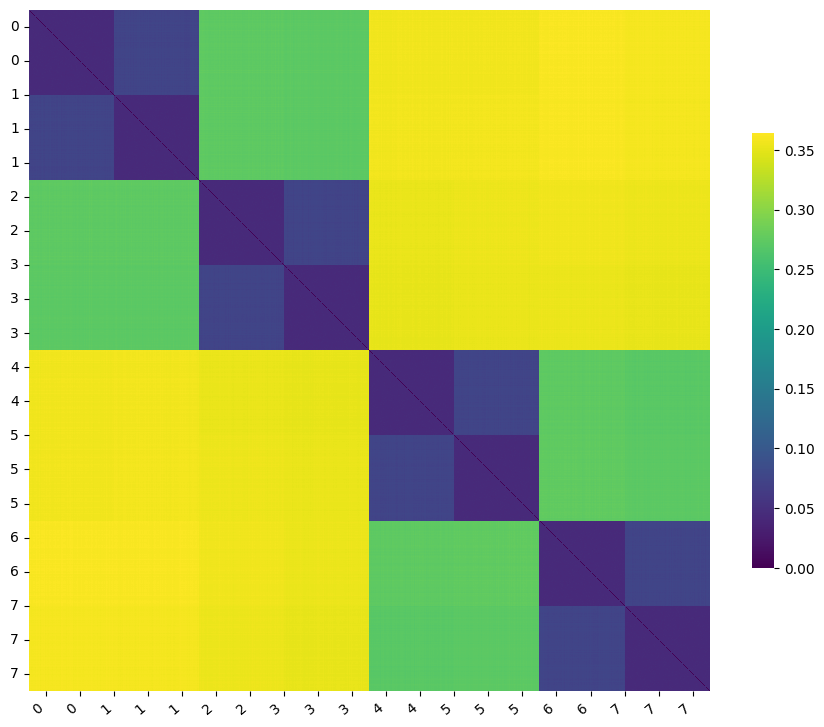

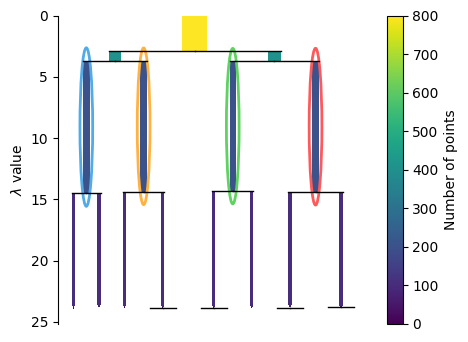

In [58]:
_ = analyze_structure(basicDistMat, simInfo, "basicSim")

In [60]:
# Make simulated categories with consistent category separation
subSimExemplars, _, _ = cat.make_categories(
    cat_rad=1,
    super_rad=1,
    basic_rad=1,
    sub_rad=1,
    nFeatures=1024,
    nImages=100,
    radius_density="power",
)

# Make similarity matrix using gcm
subSimMat = cat.default_gcm_sim_mat(subSimExemplars, c=1)

# Make distance matrix
subDistMat = 1 - subSimMat
subDistMat = subDistMat.astype(np.float64)

/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/1402565810.py:37: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  heatmapFig.show()
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/1402565810.py:88: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  treeFig.show()
/var/folders/hf/q6fxf7zn7yg8xfvf03r8j3wm0000gn/T/ipykernel_87644/4143377341.py:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  cutInfo = pd.concat(


Optimal cut for super level is at 11.520528395905702 with 2 clusters and a npARI of 1.0.
Optimal cut for basic level is at 12.645207863826151 with 4 clusters and a npARI of 1.0.
Optimal cut for sub level is at 14.477537482611114 with 8 clusters and a npARI of 1.0.
Calculating MDS
202.6389969954874


FileNotFoundError: [Errno 2] No such file or directory: './representations/subSimMDS.npy'

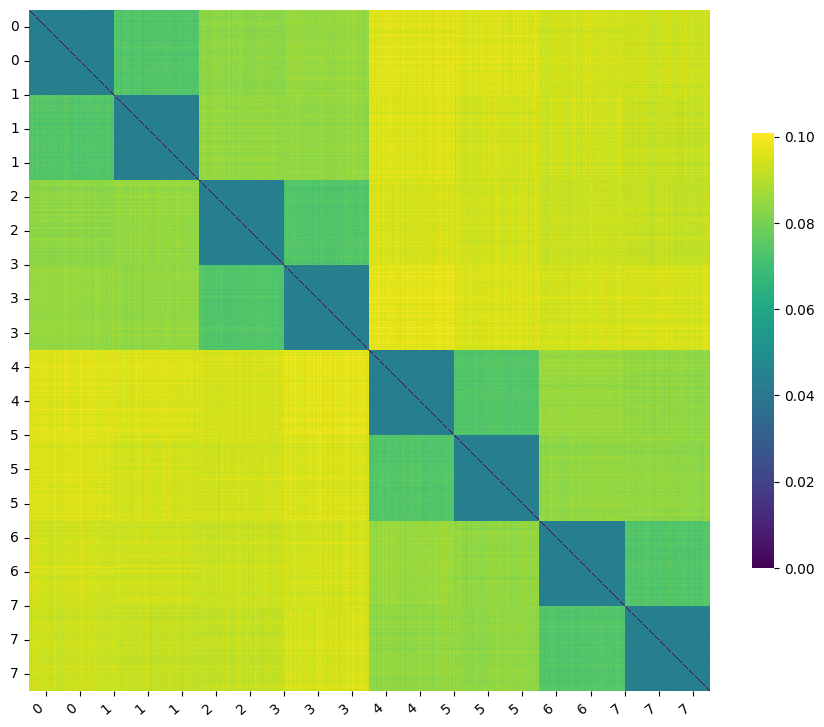

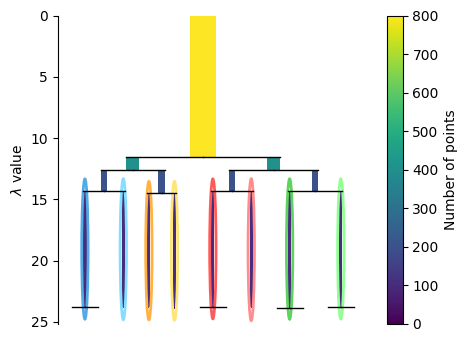

In [62]:
_ = analyze_structure(subDistMat, simInfo, "subSim", overwrite=overwrite)

# Dataset

800 images from imagenet + CUB200.

- Superordinate: 400 vehicles and 400 animals
- Basic: 200 cars, 200 busses, 200 dogs, 200 birds
- Subordinate: 40 per species of birds

Half of these images are from the training set (therefore we'll use it as category knowledge). The other half are from the Train/validation set, so we'll use them in the categorization test.

Images preprocessed by centering the features and resizing to 224x224.


In [65]:
# Load csv
imgInfo = pd.read_csv("./deepCatsImgs.csv")

# Sort the rows by super, basic, then sub (regardless of set)
imgInfo = imgInfo.sort_values(by=["super", "basic", "sub"])
imgInfo = imgInfo.reset_index(drop=True)

# Clean up subordinate names
subNames = list(imgInfo["sub"])
subNames = [name.split(".")[-1] for name in subNames]
regex = re.compile(r"n\d*-")
subNames = [re.sub(regex, "", name) for name in subNames]
subNames = [name.replace("_", " ").title() for name in subNames]

imgInfo["sub"] = subNames

imgInfo.head()

FileNotFoundError: [Errno 2] No such file or directory: './deepCatsImgs.csv'

# Models and representations

Generate representations from AlexNet trained in Mehrer et al 2022.

- 10 models are trained on Ecoset (basic-level categories)
- 10 models are trained on ImageNet (mixed levels of abstraction)


In [17]:
ecosetReps, ecosetSimMat = make_sim_matrix(
    "./models/AlexNet/ecoset_training_seeds_01_to_10/",
    imgInfo,
    "ecoset",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


In [18]:
imagenetReps, imagenetSimMat = make_sim_matrix(
    "./models/AlexNet/ILSVRC_training_seeds_01_to_10/",
    imgInfo,
    "imagenet",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


# Categorization

We use a LBA to simulate a category verification task where each model is a
different participant. We perform the task in each level of abstraction. For
each image, we calculate a drift rate to verify that that image belongs to its
category by calculating similarity of that image's representation with the
similarity of every other image of the same category (GCM-like).


In [19]:
performance = do_categorization(
    ecosetReps,
    rng,
    imgInfo,
    "ecosetWithinDefault",
    balanced=False,
    foils=False,
    ebrw_kwargs={"c": 1, "b": 0.1},
    overwrite=overwrite,
)

# Add extra info
performance["model"] = "ecoset"
performance["theory"] = "within,default"

Loading performance from file
{'c': 1, 'b': 0.1}
Accuracy
         mean       std
level                  
super  1.0000  0.000000
basic  1.0000  0.000000
sub    0.9315  0.012088
RT
             mean       std
level                      
super   12.238789  0.079078
basic   32.263384  0.202181
sub    440.448341  2.544086
Category Accuracy
                             mean       std
category                                   
animal                      1.000  0.000000
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         1.000  0.000000
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.920  0.063246
European Goldfinch          0.950  0.040825
Laysan Albatross            0.925  0.054006
White Breasted Nuthatch     0.930  0.025820
Winter Wren                 0.930  0.042164
Bloodhound                  0.920  0.053748
Chow                        0.940  0.056765
G

In [20]:
tmp = do_categorization(
    imagenetReps,
    rng,
    imgInfo,
    "imagenetWithinDefault",
    balanced=False,
    foils=False,
    ebrw_kwargs={"c": 1, "b": 0.1},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "imagenet"
tmp["theory"] = "within,default"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file
{'c': 1, 'b': 0.1}
Accuracy
          mean       std
level                   
super  1.00000  0.000000
basic  0.99950  0.001054
sub    0.91825  0.018411
RT
             mean       std
level                      
super   15.723496  0.083730
basic   41.760605  0.237315
sub    528.359908  2.530465
Category Accuracy
                             mean       std
category                                   
animal                      1.000  0.000000
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         0.998  0.004216
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.920  0.048305
European Goldfinch          0.905  0.059861
Laysan Albatross            0.930  0.034960
White Breasted Nuthatch     0.905  0.068516
Winter Wren                 0.915  0.047434
Bloodhound                  0.905  0.083166
Chow                        0.890  0.073

In [21]:
tmp = do_categorization(
    ecosetReps,
    rng,
    imgInfo,
    "ecosetWithinHighBasicMem",
    balanced=False,
    foils=False,
    ebrw_kwargs={"c": 1, "b": 0.1, "memory_strength_multiplier": [1, 2, 1]},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "ecoset"
tmp["theory"] = "within,highBasicMem"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file
{'c': 1, 'b': 0.1, 'memory_strength_multiplier': [1, 2, 1]}
Accuracy
          mean       std
level                   
super  1.00000  0.000000
basic  1.00000  0.000000
sub    0.93175  0.014769
RT
             mean       std
level                      
super   12.238789  0.079078
basic   11.475737  0.064318
sub    440.448341  2.544086
Category Accuracy
                             mean       std
category                                   
animal                      1.000  0.000000
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         1.000  0.000000
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.895  0.083166
European Goldfinch          0.935  0.047434
Laysan Albatross            0.925  0.058926
White Breasted Nuthatch     0.905  0.079757
Winter Wren                 0.920  0.053748
Bloodhound                  0.935  0.062583

In [22]:
tmp = do_categorization(
    imagenetReps,
    rng,
    imgInfo,
    "imagenetWithinHighBasicMem",
    balanced=False,
    foils=False,
    ebrw_kwargs={"c": 1, "b": 0.1, "memory_strength_multiplier": [1, 2, 1]},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "imagenet"
tmp["theory"] = "within,highBasicMem"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file


{'c': 1, 'b': 0.1, 'memory_strength_multiplier': [1, 2, 1]}
Accuracy
        mean       std
level                 
super  1.000  0.000000
basic  1.000  0.000000
sub    0.911  0.009944
RT
             mean       std
level                      
super   15.723496  0.083730
basic   14.433225  0.073405
sub    528.359908  2.530465
Category Accuracy
                             mean       std
category                                   
animal                      1.000  0.000000
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         1.000  0.000000
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.885  0.062583
European Goldfinch          0.900  0.062361
Laysan Albatross            0.940  0.051640
White Breasted Nuthatch     0.885  0.047434
Winter Wren                 0.855  0.079757
Bloodhound                  0.920  0.071492
Chow                        0.870  0.07

In [23]:
tmp = do_categorization(
    ecosetReps,
    rng,
    imgInfo,
    "ecosetBetween",
    balanced=False,
    foils=True,
    ebrw_kwargs={"c": 15, "b": 0},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "ecoset"
tmp["theory"] = "between"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file


{'c': 15, 'b': 0}
Accuracy
          mean       std
level                   
super  0.99650  0.001291
basic  0.98375  0.007840
sub    0.04125  0.005171
RT
             mean        std
level                       
super  255.445146  12.116919
basic  458.842207  23.276607
sub    807.467496  53.428886
Category Accuracy
                             mean       std
category                                   
animal                      0.993  0.002582
vehicle                     1.000  0.000000
bird                        0.991  0.009944
dog                         0.944  0.025906
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.080  0.048305
European Goldfinch          0.010  0.031623
Laysan Albatross            0.005  0.015811
White Breasted Nuthatch     0.000  0.000000
Winter Wren                 0.050  0.033333
Bloodhound                  0.265  0.066875
Chow                        0.005  0.015811
German Shepherd       

In [24]:
tmp = do_categorization(
    imagenetReps,
    rng,
    imgInfo,
    "imagenetBetween",
    balanced=False,
    foils=True,
    ebrw_kwargs={"c": 15, "b": 0},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "imagenet"
tmp["theory"] = "between"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file


{'c': 15, 'b': 0}
Accuracy
          mean       std
level                   
super  0.93500  0.013540
basic  0.99050  0.001972
sub    0.32925  0.007458
RT
              mean        std
level                        
super   641.251704  35.594243
basic   498.352020  30.291641
sub    1516.554557  98.917653
Category Accuracy
                             mean       std
category                                   
animal                      0.870  0.027080
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         0.963  0.009487
car                         1.000  0.000000
plane                       0.999  0.003162
Barn Swallow                0.655  0.036893
European Goldfinch          0.595  0.083166
Laysan Albatross            0.535  0.081820
White Breasted Nuthatch     0.230  0.048305
Winter Wren                 0.495  0.068516
Bloodhound                  0.955  0.015811
Chow                        0.735  0.088349
German Shepherd  

In [25]:
tmp = do_categorization(
    ecosetReps,
    rng,
    imgInfo,
    "ecosetBetweenBalanced",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 13, "b": 0, "A": 30, "B": 30},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "ecoset"
tmp["theory"] = "betweenBalanced"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file


{'c': 13, 'b': 0, 'A': 30, 'B': 30}
Accuracy
          mean       std
level                   
super  0.99725  0.000791
basic  0.98950  0.005110
sub    0.87925  0.016627
RT
             mean        std
level                       
super  572.872885  35.055301
basic  557.721056  57.379487
sub    763.561380  37.018366
Category Accuracy
                              mean       std
category                                    
animal                      0.9945  0.001581
vehicle                     1.0000  0.000000
bird                        1.0000  0.000000
dog                         0.9580  0.020440
car                         1.0000  0.000000
plane                       1.0000  0.000000
Barn Swallow                0.9350  0.085147
European Goldfinch          0.9950  0.015811
Laysan Albatross            0.9950  0.015811
White Breasted Nuthatch     0.9600  0.051640
Winter Wren                 0.9700  0.048305
Bloodhound                  0.9500  0.033333
Chow                        1.0000

In [26]:
tmp = do_categorization(
    imagenetReps,
    rng,
    imgInfo,
    "imagenetBetweenBalanced",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 15, "b": 0, "A": 10, "B": 10},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "imagenet"
tmp["theory"] = "betweenBalanced"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file


{'c': 15, 'b': 0, 'A': 10, 'B': 10}
Accuracy
          mean       std
level                   
super  0.92800  0.023058
basic  0.99075  0.002648
sub    0.88025  0.013967
RT
              mean         std
level                         
super  1393.388377  118.649837
basic   515.491614   44.962884
sub     248.851092   18.823654
Category Accuracy
                             mean       std
category                                   
animal                      0.856  0.046116
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         0.963  0.010593
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                1.000  0.000000
European Goldfinch          1.000  0.000000
Laysan Albatross            0.995  0.015811
White Breasted Nuthatch     0.885  0.066875
Winter Wren                 0.995  0.015811
Bloodhound                  1.000  0.000000
Chow                        1.000  0.0

In [27]:
tmp = do_categorization(
    ecosetReps,
    rng,
    imgInfo,
    "ecosetBetweenBalancedHighSens",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 30, "b": 0, "A": 10, "B": 10},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "ecoset"
tmp["theory"] = "betweenBalancedHighSens"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file
{'c': 30, 'b': 0, 'A': 10, 'B': 10}
Accuracy
          mean       std
level                   
super  0.99825  0.001208
basic  0.98900  0.006258
sub    0.85500  0.015456
RT
             mean        std
level                       
super  143.628045  17.514670
basic  112.190696  18.827878
sub     80.889354  12.435157
Category Accuracy
                              mean       std
category                                    
animal                      0.9965  0.002415
vehicle                     1.0000  0.000000
bird                        0.9980  0.004216
dog                         0.9580  0.024855
car                         1.0000  0.000000
plane                       1.0000  0.000000
Barn Swallow                0.9600  0.031623
European Goldfinch          0.9900  0.021082
Laysan Albatross            0.9950  0.015811
White Breasted Nuthatch     0.9200  0.067495
Winter Wren                 0.9300  0.063246
Bloodhound                  0.9450  0.036893
Chow

In [28]:
tmp = do_categorization(
    imagenetReps,
    rng,
    imgInfo,
    "imagenetBetweenBalancedHighSens",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 30, "b": 0, "A": 10, "B": 10},
    overwrite=overwrite,
)

# Add extra info
tmp["model"] = "imagenet"
tmp["theory"] = "betweenBalancedHighSens"

performance = pd.concat([performance, tmp], axis=0)

Loading performance from file
{'c': 30, 'b': 0, 'A': 10, 'B': 10}
Accuracy
          mean       std
level                   
super  0.97800  0.007800
basic  0.99300  0.002838
sub    0.88075  0.017561
RT
             mean         std
level                        
super  525.758658  166.356992
basic  179.495708   32.755671
sub     50.757826    9.404225
Category Accuracy
                             mean       std
category                                   
animal                      0.956  0.015599
vehicle                     1.000  0.000000
bird                        1.000  0.000000
dog                         0.972  0.011353
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                1.000  0.000000
European Goldfinch          1.000  0.000000
Laysan Albatross            0.990  0.021082
White Breasted Nuthatch     0.910  0.056765
Winter Wren                 1.000  0.000000
Bloodhound                  1.000  0.000000
Chow         

In [29]:
# Add a model_seed column
performance["model_seed"] = performance["model"] + "_" + performance["seed"].astype(str)

# Reorder super,basic,sub levels
performance["level"] = pd.Categorical(
    performance["level"], categories=["super", "basic", "sub"], ordered=True
)


# Make a summary
allPerfAccSummary = (
    performance.groupby(["theory", "model", "seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["theory", "model", "level"])
    .agg(["mean", "std"])
)
allPerfRTSummary = (
    performance.groupby(["theory", "model", "seed", "level"])["RT"]
    .agg("mean")
    .groupby(["theory", "model", "level"])
    .agg(["mean", "std"])
)

print(allPerfAccSummary)
print(allPerfRTSummary)

                                           mean       std
theory                  model    level                   
between                 ecoset   super  0.99650  0.001291
                                 basic  0.98375  0.007840
                                 sub    0.04125  0.005171
                        imagenet super  0.93500  0.013540
                                 basic  0.99050  0.001972
                                 sub    0.32925  0.007458
betweenBalanced         ecoset   super  0.99725  0.000791
                                 basic  0.98950  0.005110
                                 sub    0.87925  0.016627
                        imagenet super  0.92800  0.023058
                                 basic  0.99075  0.002648
                                 sub    0.88025  0.013967
betweenBalancedHighSens ecoset   super  0.99825  0.001208
                                 basic  0.98900  0.006258
                                 sub    0.85500  0.015456
              

/tmp/ipykernel_286149/1724246390.py:22: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0, 0].set_xticklabels(ax[0, 0].get_xticklabels(), rotation=15, ha="center")
/tmp/ipykernel_286149/1724246390.py:40: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[0, 1].set_xticklabels(ax[0, 1].get_xticklabels(), rotation=15, ha="center")
/tmp/ipykernel_286149/1724246390.py:62: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1, 0].set_xticklabels(ax[1, 0].get_xticklabels(), rotation=15, ha="center")
/tmp/ipykernel_286149/1724246390.py:80: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax[1, 1].set_xticklabels(ax[1, 1].get_xticklabels(), rotation=15, ha="center")


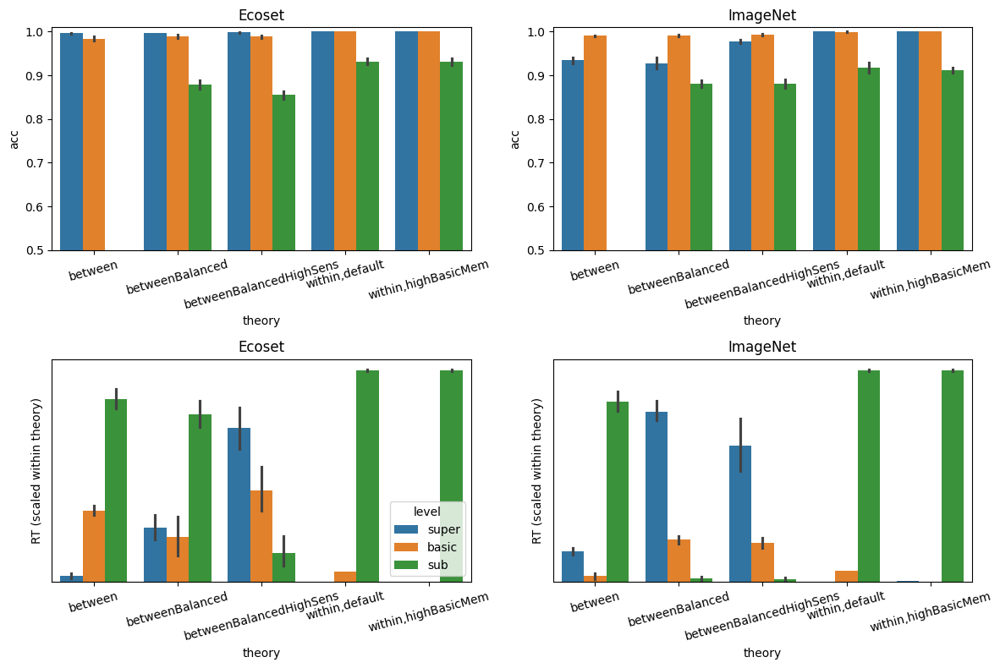

In [30]:
# Make 2x2 plot of accuracy and RT
fig, ax = plt.subplots(2, 2, figsize=(12, 8))

# Make plot data
plotData = performance.groupby(["theory", "model", "level", "model_seed"])[
    ["response", "RT"]
].agg(
    acc=pd.NamedAgg(column="response", aggfunc=lambda x: np.mean(x == "yes")),
    RT=pd.NamedAgg(column="RT", aggfunc="mean"),
)

# Accuracy for ecoset models
sns.barplot(
    x="theory",
    y="acc",
    hue="level",
    data=plotData.loc[(slice(None), "ecoset"), :].reset_index(),
    ax=ax[0, 0],
)

# Rotate x axis labels
ax[0, 0].set_xticklabels(ax[0, 0].get_xticklabels(), rotation=15, ha="center")
# Add title
ax[0, 0].set_title("Ecoset")
# Set yaxis
ax[0, 0].set_ylim(0.5, 1.01)
# Remove legend
ax[0, 0].get_legend().remove()

# Accuracy for imagenet models
sns.barplot(
    x="theory",
    y="acc",
    hue="level",
    data=plotData.loc[(slice(None), "imagenet"), :].reset_index(),
    ax=ax[0, 1],
)

# Rotate x axis labels
ax[0, 1].set_xticklabels(ax[0, 1].get_xticklabels(), rotation=15, ha="center")
# Add title
ax[0, 1].set_title("ImageNet")
# Set yaxis
ax[0, 1].set_ylim(0.5, 1.01)
# Remove legend
ax[0, 1].get_legend().remove()

# Rescale RTs for each theory
plotData["RT"] = plotData.groupby(["theory", "model"])["RT"].transform(
    lambda x: (x - x.min()) / (x.max() - x.min())
)
# RT for ecoset models
sns.barplot(
    x="theory",
    y="RT",
    hue="level",
    data=plotData.loc[(slice(None), "ecoset"), :].reset_index(),
    ax=ax[1, 0],
)

# Rotate x axis labels
ax[1, 0].set_xticklabels(ax[1, 0].get_xticklabels(), rotation=15, ha="center")
# Add title
ax[1, 0].set_title("Ecoset")
# Turn off yaxis ticks
ax[1, 0].set_yticks([])
# Set yaxis label
ax[1, 0].set_ylabel("RT (scaled within theory)")

# RT for imagenet models
sns.barplot(
    x="theory",
    y="RT",
    hue="level",
    data=plotData.loc[(slice(None), "imagenet"), :].reset_index(),
    ax=ax[1, 1],
)

# Rotate x axis labels
ax[1, 1].set_xticklabels(ax[1, 1].get_xticklabels(), rotation=15, ha="center")
# Add title
ax[1, 1].set_title("ImageNet")
# Turn off yaxis ticks
ax[1, 1].set_yticks([])
# Set yaxis label
ax[1, 1].set_ylabel("RT (scaled within theory)")
# Remove legend
ax[1, 1].get_legend().remove()

# Tight layout
plt.tight_layout()

fig.show()

In [31]:
# Analyze only vehicles
vehicles = [
    "vehicle",
    "car",
    "plane",
    "106.Ford_Edge_SUV_2012",
    "131.Hyundai_Elantra_Sedan_2007",
    "158.Mazda_Tribute_SUV_2011",
    "171.Plymouth_Neon_Coupe_1999",
    "177.Scion_xD_Hatchback_2012",
    "767-400",
    "Beechcraft_1900",
    "DC-10",
    "EMB-120",
    "Tu-154",
]

allPerformanceVehicles = performance.loc[
    [cats in vehicles for cats in performance["category"]]
]

# Make a summary
vehiclePerfAccSummary = (
    allPerformanceVehicles.groupby(["theory", "model", "seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["theory", "model", "level"])
    .agg(["mean", "std"])
)
vehiclePerfRTSummary = (
    allPerformanceVehicles.groupby(["theory", "model", "seed", "level"])["RT"]
    .agg("mean")
    .groupby(["theory", "model", "level"])
    .agg(["mean", "std"])
)

print(vehiclePerfAccSummary)
print(vehiclePerfRTSummary)

                                          mean       std
theory                  model    level                  
between                 ecoset   super  1.0000  0.000000
                                 basic  1.0000  0.000000
                                 sub    0.1225  0.007906
                        imagenet super  1.0000  0.000000
                                 basic  0.9995  0.001581
                                 sub    0.1250  0.016667
betweenBalanced         ecoset   super  1.0000  0.000000
                                 basic  1.0000  0.000000
                                 sub    0.6625  0.092983
                        imagenet super  1.0000  0.000000
                                 basic  1.0000  0.000000
                                 sub    0.6900  0.051640
betweenBalancedHighSens ecoset   super  1.0000  0.000000
                                 basic  1.0000  0.000000
                                 sub    0.7025  0.055840
                        imagene

# Analyze structure of real representations


Optimal cut for super level is at 2.732513247884964 with 3 clusters and a npARI of 0.5429342035025219.
Optimal cut for basic level is at 2.7727956500541264 with 4 clusters and a npARI of 0.5120210223354047.
Optimal cut for sub level is at 2.7727956500541264 with 4 clusters and a npARI of 0.1152077887041785.
Loading MDS
super: 0.10213802009820938
    animal: 0.07104108482599258
    vehicle: 0.13323496282100677
basic: 0.11251281946897507
    animal: 0.06061100959777832
        bird: 0.07105888426303864
        dog: 0.050163134932518005
    vehicle: 0.16441461443901062
        car: 0.16150283813476562
        plane: 0.1673264056444168
sub: 0.014767345041036606
    bird: 0.028165096417069435
        Barn Swallow: 0.01295045018196106
        European Goldfinch: 0.031105035915970802
        Laysan Albatross: 0.0428534634411335
        White Breasted Nuthatch: 0.009512585587799549
        Winter Wren: 0.044403932988643646
    dog: 0.02728971280157566
        Bloodhound: 0.04091536998748779
  

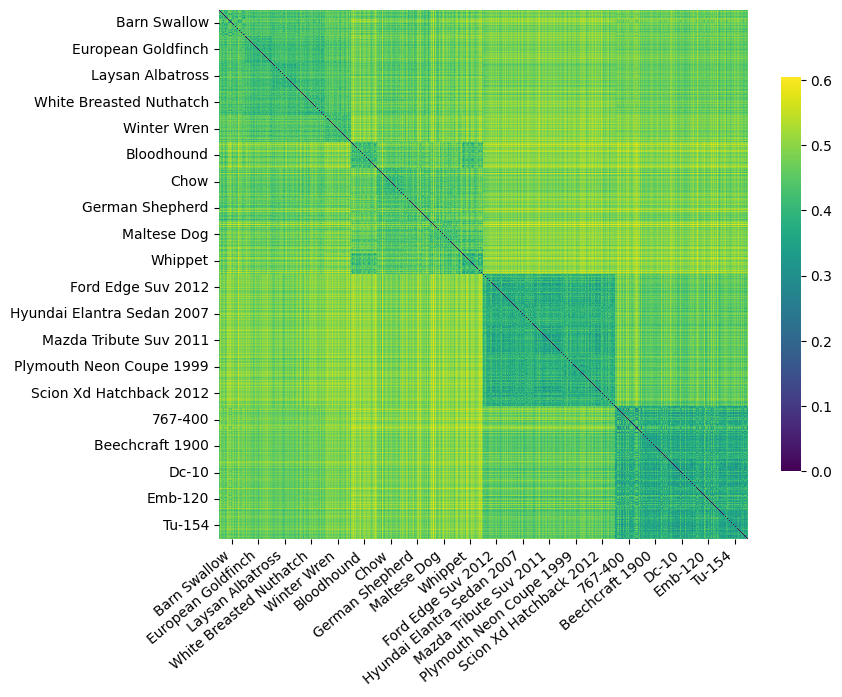

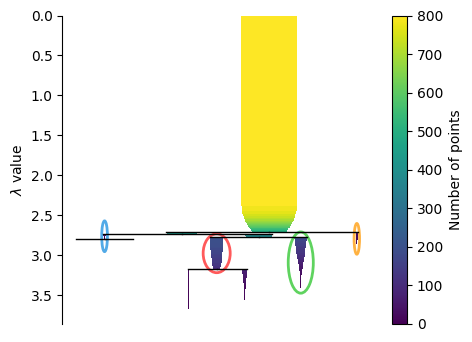

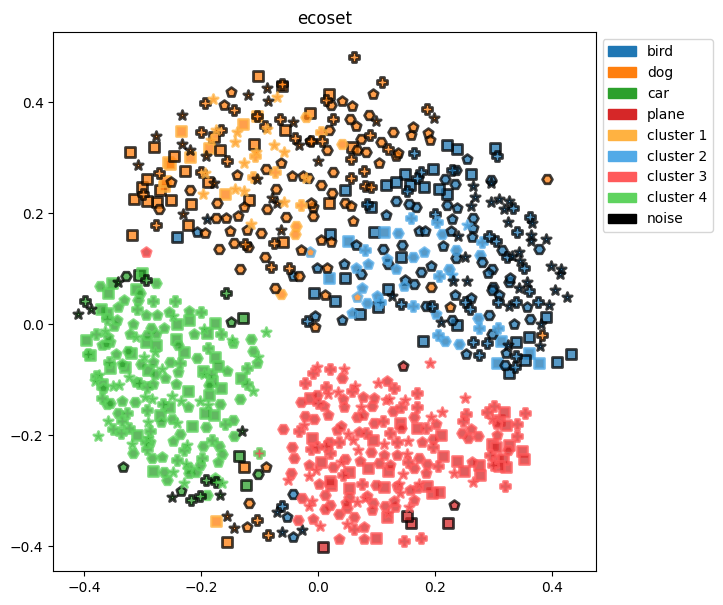

In [32]:
_, ecosetSolution, _, _ = analyze_structure(
    1 - ecosetSimMat, imgInfo, "ecoset", overwrite=overwrite
)

Optimal cut for super level is at 2.3778264760348167 with 3 clusters and a npARI of 0.5061969921089742.
Optimal cut for basic level is at 2.7681420111001445 with 3 clusters and a npARI of 0.21667751070832145.
Optimal cut for sub level is at 2.7681420111001445 with 3 clusters and a npARI of 0.04722078298796027.
Loading MDS
super: 0.08139175176620483
    animal: -0.011525754816830158
    vehicle: 0.17430926859378815
basic: 0.08819010108709335
    animal: 0.017388753592967987
        bird: 0.03546418994665146
        dog: -0.00068668246967718
    vehicle: 0.15899144113063812
        car: 0.182148277759552
        plane: 0.13583460450172424
sub: 0.03630141168832779
    bird: 0.04963115602731705
        Barn Swallow: 0.043499670922756195
        European Goldfinch: 0.0561588890850544
        Laysan Albatross: 0.047648146748542786
        White Breasted Nuthatch: 0.029636403545737267
        Winter Wren: 0.07121266424655914
    dog: 0.08700922131538391
        Bloodhound: 0.15972623229026794

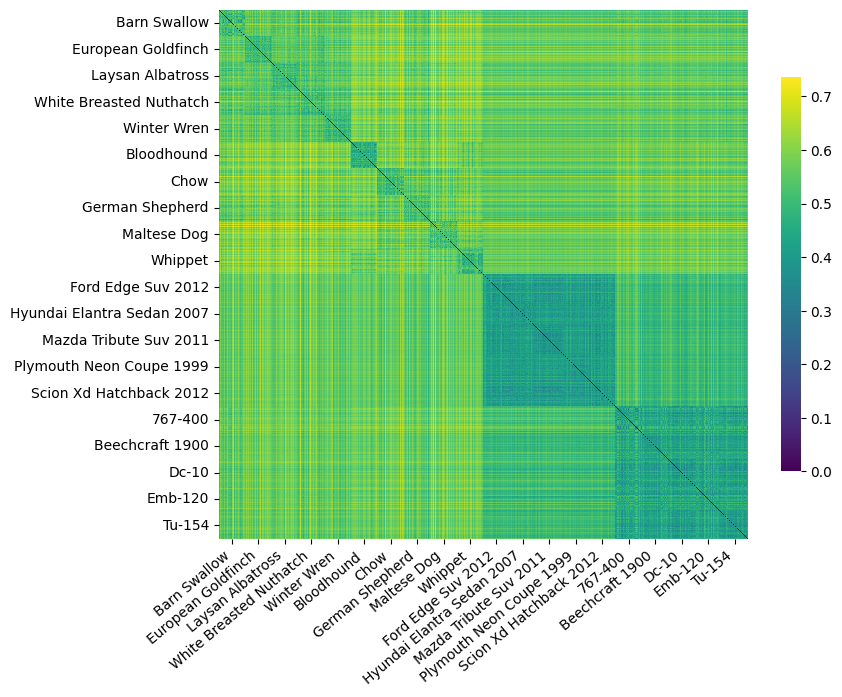

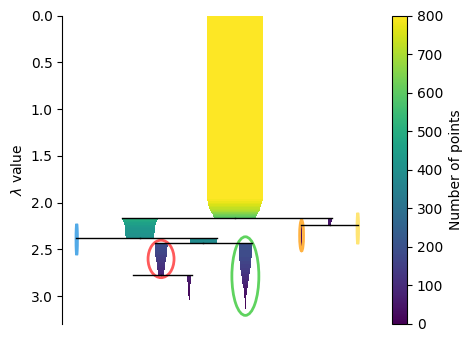

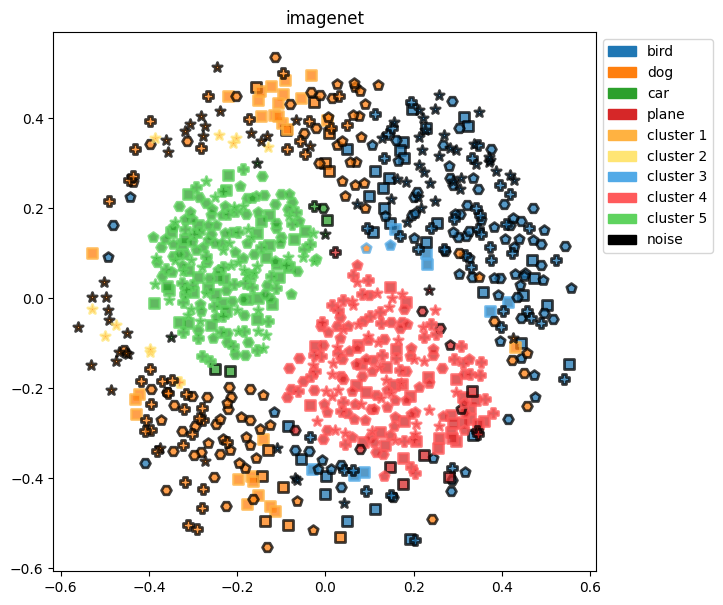

In [33]:
_ = analyze_structure(
    1 - imagenetSimMat,
    imgInfo,
    "imagenet",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

In [34]:
# Cleanup unnecessary reps
del ecosetReps
del imagenetReps

# Load data from trained expert models


In [35]:
# Load training data
birdTrainingData = pd.read_csv("./twoHotOnlyBirds.csv")
# Add model type column
birdTrainingData["Freeze Basic"] = False

tmp = pd.read_csv("./twoHotFreezeBasicOnlyBirds.csv")
tmp["Freeze Basic"] = True

birdTrainingData = pd.concat([birdTrainingData, tmp], axis=0)

# Make epoch index from 1
birdTrainingData["epoch"] = birdTrainingData["epoch"] + 1

birdTrainingData.head()

,epoch,accuracy,loss,sub_top1,sub_top5,top_k_categorical_accuracy,val_accuracy,val_loss,val_sub_top1,val_sub_top5,val_top_k_categorical_accuracy,Freeze Basic
0,1,0.527646,3.426523,0.040874,0.133634,0.781970,0.515709,5.585853,0.061443,0.176907,0.768783,False
1,2,0.528560,3.388174,0.041208,0.146480,0.781171,0.517591,5.511328,0.056093,0.181222,0.766988,False
2,3,0.529299,3.380846,0.036203,0.118619,0.781733,0.511679,5.512928,0.031067,0.105454,0.769577,False
3,4,0.563309,3.115830,0.040040,0.138972,0.803030,0.538419,5.163689,0.038833,0.155333,0.784462,False
4,5,0.563685,3.090729,0.044878,0.153153,0.803836,0.547655,5.127367,0.053849,0.166724,0.792405,False


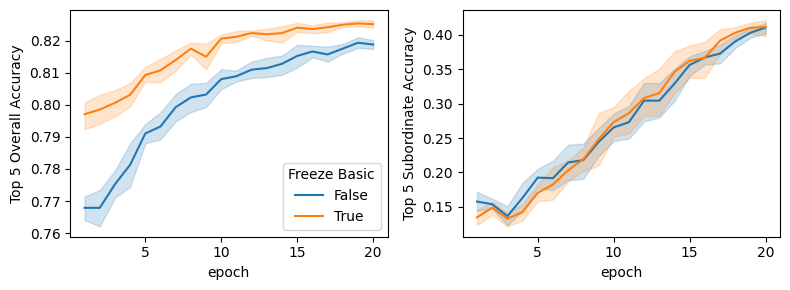

In [36]:
# Plot average accuracy
fig, ax = plt.subplots(1, 2, figsize=(8, 3))

# Plot top 5 overall accuracy
sns.lineplot(
    data=birdTrainingData,
    x="epoch",
    y="val_top_k_categorical_accuracy",
    hue="Freeze Basic",
    ax=ax[0],
)

# Rename yaxis
ax[0].set_ylabel("Top 5 Overall Accuracy")


# Plot top 5 sub accuracy
sns.lineplot(
    data=birdTrainingData,
    x="epoch",
    y="val_sub_top5",
    hue="Freeze Basic",
    ax=ax[1],
    legend=False,
)

# Rename yaxis
ax[1].set_ylabel("Top 5 Subordinate Accuracy")

# Tighten layout
plt.tight_layout()

fig.show()

In [37]:
birdExpertReps, birdExpertSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/twoHotOnlyBirds",
    imgInfo,
    "birdExpert",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


In [38]:
birdExpertFreezeReps, birdExpertFreezeSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/twoHotFreezeBasicOnlyBirds",
    imgInfo,
    "birdExpertFreeze",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


# Expert Model Categorization


In [39]:
birdExpertPerf = do_categorization(
    birdExpertReps,
    rng,
    imgInfo,
    "birdExpert",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 10, "b": 0, "A": 12, "B": 12},
    overwrite=overwrite,
)

Loading performance from file
{'c': 10, 'b': 0, 'A': 12, 'B': 12}
Accuracy
          mean       std
level                   
super  0.99675  0.001208
basic  0.98975  0.004480
sub    0.84100  0.019903
RT
             mean        std
level                       
super  188.590649  21.526148
basic  157.005478  24.692055
sub    201.366295  24.650088
Category Accuracy
                              mean       std
category                                    
animal                      0.9935  0.002415
vehicle                     1.0000  0.000000
bird                        0.9930  0.008233
dog                         0.9660  0.015776
car                         1.0000  0.000000
plane                       1.0000  0.000000
Barn Swallow                0.9250  0.075462
European Goldfinch          0.9900  0.031623
Laysan Albatross            0.8650  0.062583
White Breasted Nuthatch     0.9900  0.021082
Winter Wren                 0.9350  0.041164
Bloodhound                  1.0000  0.000000
Chow

In [40]:
birdExpertFreezePerf = do_categorization(
    birdExpertFreezeReps,
    rng,
    imgInfo,
    "birdExpertFreeze",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 10, "b": 0, "A": 12, "B": 12},
    overwrite=overwrite,
)

Loading performance from file
{'c': 10, 'b': 0, 'A': 12, 'B': 12}
Accuracy
          mean       std
level                   
super  0.99725  0.000791
basic  0.98675  0.004866
sub    0.84425  0.017242
RT
             mean        std
level                       
super  272.858339  18.949937
basic  224.373234  19.846104
sub    271.679476  13.475983
Category Accuracy
                              mean       std
category                                    
animal                      0.9945  0.001581
vehicle                     1.0000  0.000000
bird                        0.9950  0.007071
dog                         0.9530  0.017670
car                         0.9990  0.003162
plane                       1.0000  0.000000
Barn Swallow                0.9100  0.045947
European Goldfinch          0.9950  0.015811
Laysan Albatross            0.9000  0.094281
White Breasted Nuthatch     0.9700  0.034960
Winter Wren                 0.9350  0.052967
Bloodhound                  0.9950  0.015811
Chow

In [41]:
birds = [
    "bird",
    "Laysan Albatross",
    "European Goldfinch",
    "White Breasted Nuthatch",
    "Barn Swallow",
    "Winter Wren",
]
birdOnlyExpertPerf = birdExpertPerf.loc[
    [category in birds for category in birdExpertPerf["category"]]
]

perfAccSummary = (
    birdOnlyExpertPerf.groupby(["model", "seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)
perfRTSummary = (
    birdOnlyExpertPerf.groupby(["model", "seed", "level"])["RT"]
    .agg("mean")
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)

print(perfAccSummary)
print(perfRTSummary)

                   mean       std
model      level                 
birdExpert super    NaN       NaN
           basic  0.993  0.008233
           sub    0.941  0.017920
                        mean        std
model      level                       
birdExpert super         NaN        NaN
           basic  178.430588  26.148235
           sub    213.924009  26.593214


# Analyze expert model structure


Optimal cut for super level is at 2.304779818537846 with 2 clusters and a npARI of 0.61125.
Optimal cut for basic level is at 2.304779818537846 with 2 clusters and a npARI of 0.2643250253451529.
Optimal cut for sub level is at 2.304779818537846 with 2 clusters and a npARI of 0.04720756076527742.
Loading MDS
super: 0.1387103796005249
    animal: 0.10832316428422928
    vehicle: 0.16909760236740112
basic: 0.14109569787979126
    animal: 0.10012105107307434
        bird: 0.11684108525514603
        dog: 0.08340100944042206
    vehicle: 0.18207034468650818
        car: 0.1701289713382721
        plane: 0.19401170313358307
sub: 0.013696865178644657
    bird: 0.024424105882644653
        Barn Swallow: 0.00257910811342299
        European Goldfinch: 0.03725482150912285
        Laysan Albatross: 0.003324062330648303
        White Breasted Nuthatch: 0.03747892379760742
        Winter Wren: 0.04148361459374428
    dog: 0.028505578637123108
        Bloodhound: 0.049431782215833664
        Chow: 0

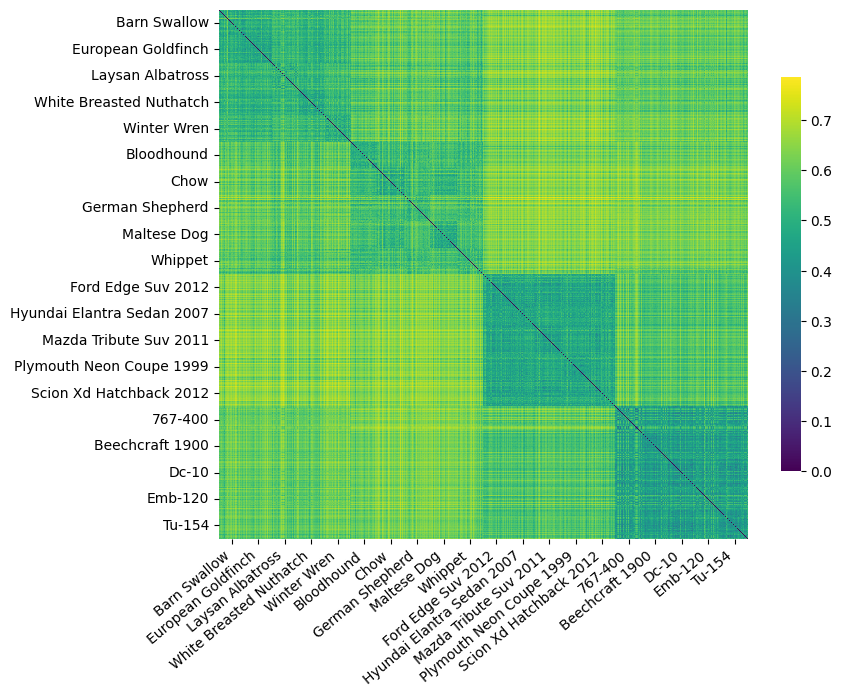

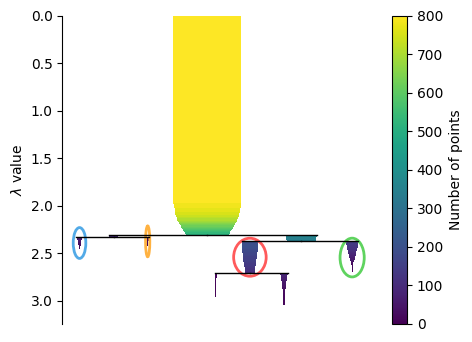

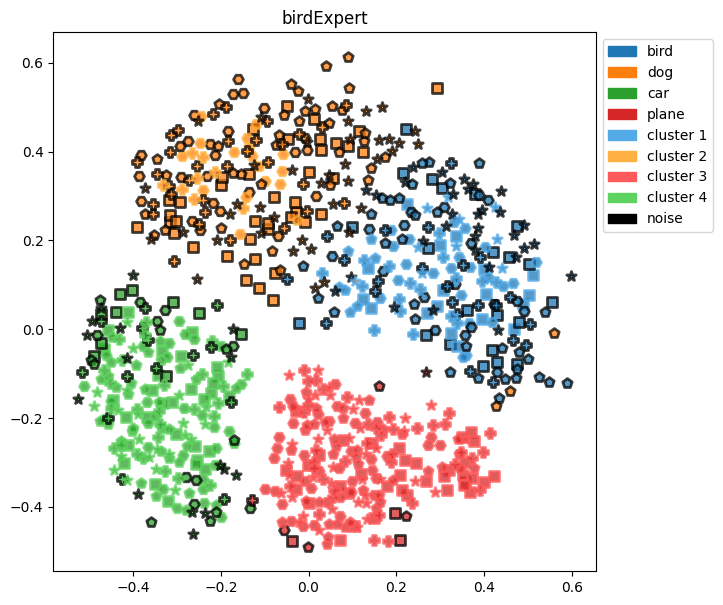

In [42]:
_ = analyze_structure(
    1 - birdExpertSimMat,
    imgInfo,
    "birdExpert",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

Optimal cut for super level is at 2.223434166945857 with 2 clusters and a npARI of 0.6075.
Optimal cut for basic level is at 2.297561387113773 with 3 clusters and a npARI of 0.46921263835934257.
Optimal cut for sub level is at 2.297561387113773 with 3 clusters and a npARI of 0.10810433015939888.
Loading MDS
super: 0.12592774629592896
    animal: 0.09828335046768188
    vehicle: 0.15357215702533722
basic: 0.13048453629016876
    animal: 0.09128913283348083
        bird: 0.11100885272026062
        dog: 0.07156941294670105
    vehicle: 0.16967995464801788
        car: 0.15251776576042175
        plane: 0.186842143535614
sub: 0.013101059943437576
    bird: 0.024111485108733177
        Barn Swallow: 0.005066449288278818
        European Goldfinch: 0.03579425811767578
        Laysan Albatross: 0.0023913364857435226
        White Breasted Nuthatch: 0.03945174440741539
        Winter Wren: 0.03785363957285881
    dog: 0.026308154687285423
        Bloodhound: 0.04855076223611832
        Chow: 

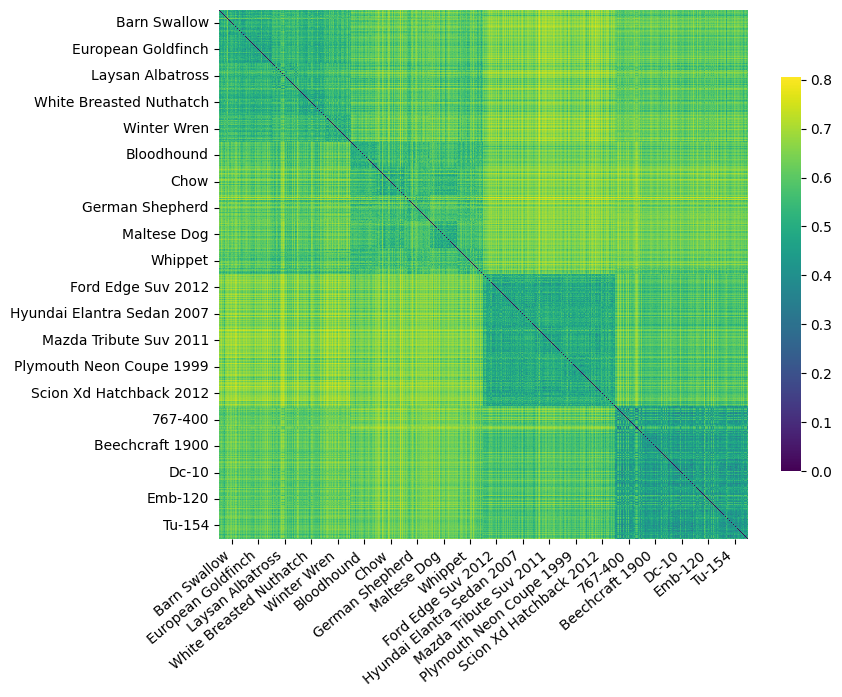

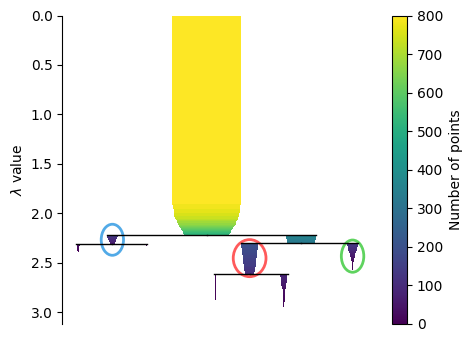

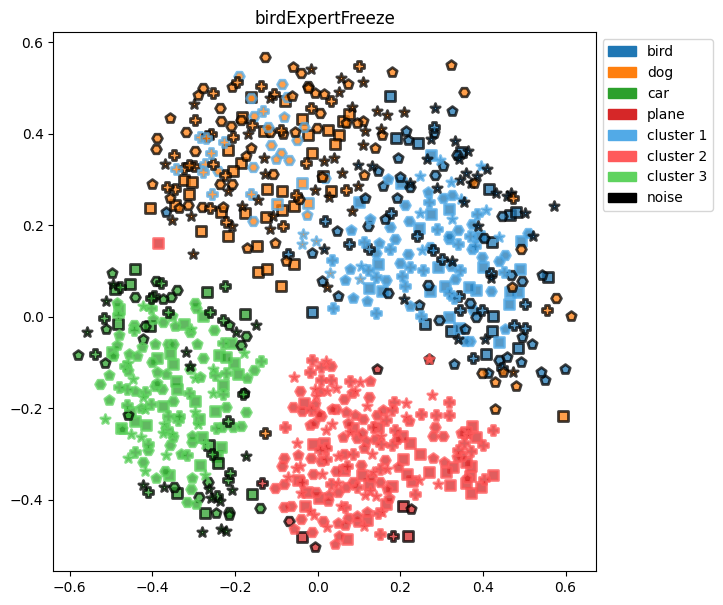

In [43]:
_ = analyze_structure(
    1 - birdExpertFreezeSimMat,
    imgInfo,
    "birdExpertFreeze",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

No clusters found for super level.
No clusters found for basic level.
No clusters found for sub level.
Loading MDS
sub: 0.024621376767754555
    bird: 0.024621376767754555
        Barn Swallow: 0.0027683721855282784
        European Goldfinch: 0.03725482150912285
        Laysan Albatross: 0.003324062330648303
        White Breasted Nuthatch: 0.03823152184486389
        Winter Wren: 0.04152810573577881


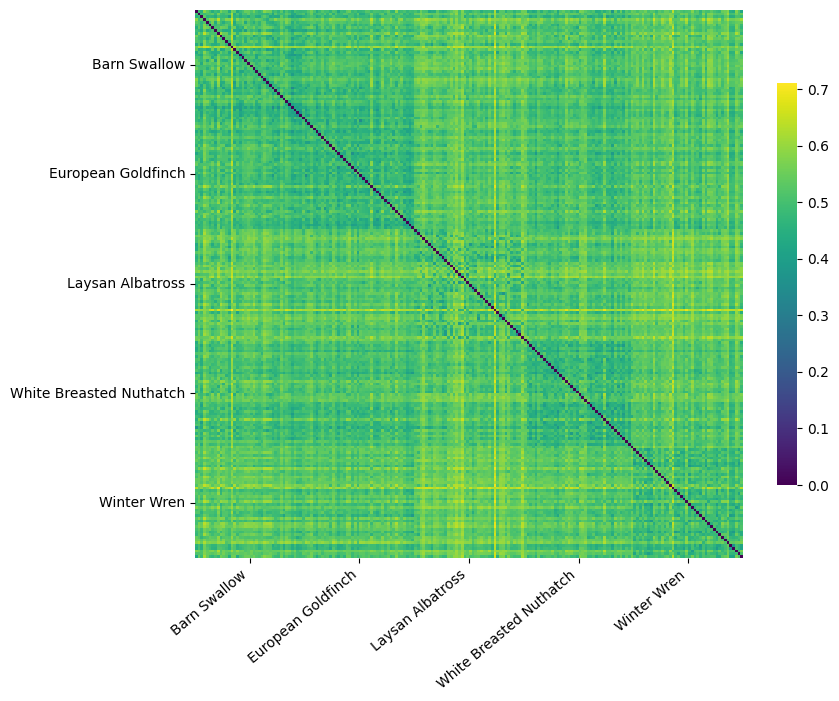

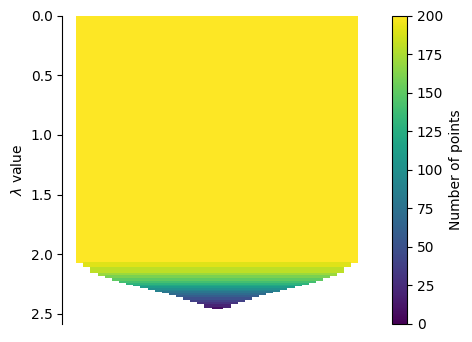

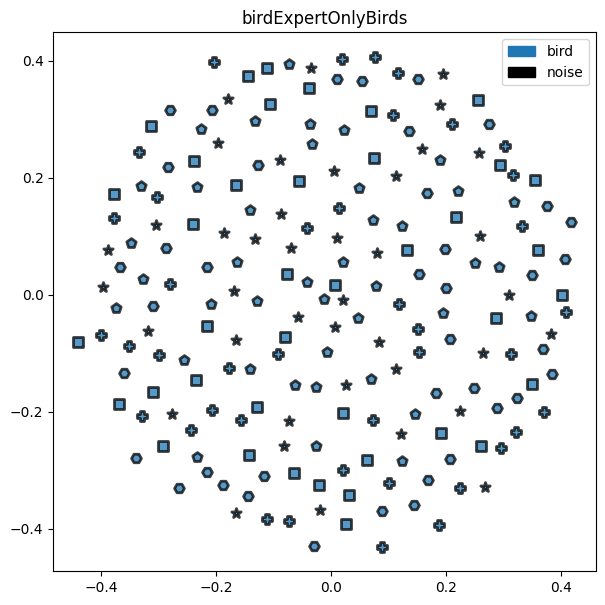

In [44]:
onlyBirdsImgInfo = imgInfo.loc[imgInfo["basic"] == "bird"]
birdExpertOnlyBirdsDistMat = (
    1 - birdExpertSimMat[np.ix_(onlyBirdsImgInfo.index, onlyBirdsImgInfo.index)]
)
_ = analyze_structure(
    birdExpertOnlyBirdsDistMat,
    onlyBirdsImgInfo,
    "birdExpertOnlyBirds",
    overwrite=overwrite,
)

# Look at structure from fine tuned model


In [45]:
# Load training data
finetuneTrainingData = pd.read_csv("./finetune.csv")

# Make epoch index from 1
finetuneTrainingData["epoch"] = finetuneTrainingData["epoch"] + 1

finetuneTrainingData.head()

,epoch,accuracy,loss,top_k_categorical_accuracy,val_accuracy,val_loss,val_top_k_categorical_accuracy
0,1,0.114114,6.214863,0.284117,0.253711,5.140783,0.515878
1,2,0.390390,4.386986,0.688522,0.318260,4.672735,0.619261
2,3,0.563397,3.566775,0.839339,0.353814,4.518688,0.658267
3,4,0.698866,3.030098,0.918418,0.366068,4.528484,0.672075
4,5,0.890724,2.424775,0.988155,0.402831,4.391075,0.704522


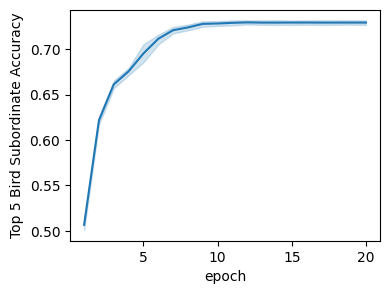

In [46]:
# Plot average accuracy over epochs
fig, ax = plt.subplots(1, 1, figsize=(4, 3))

# Plot top 5 accuracy
sns.lineplot(
    data=finetuneTrainingData, x="epoch", y="val_top_k_categorical_accuracy", ax=ax
)

# Rename yaxis
ax.set_ylabel("Top 5 Bird Subordinate Accuracy")

fig.show()

In [47]:
finetuneBirdsReps, finetuneBirdsSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/finetune",
    imgInfo,
    "finetuneBirds",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


# Finetuned bird model categorization


In [48]:
finetuneBirdsPerf = do_categorization(
    finetuneBirdsReps,
    rng,
    imgInfo,
    "finetuneBirds",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 9, "b": 0, "A": 25, "B": 25},
    overwrite=overwrite,
)

Loading performance from file
{'c': 9, 'b': 0, 'A': 25, 'B': 25}
Accuracy
         mean       std
level                  
super  0.9615  0.010355
basic  0.9775  0.006872
sub    0.8715  0.013954
RT
             mean        std
level                       
super  137.576747  13.415663
basic   94.206589  10.861972
sub     73.563019   7.202780
Category Accuracy
                             mean       std
category                                   
animal                      0.923  0.020710
vehicle                     1.000  0.000000
bird                        0.927  0.032677
dog                         0.983  0.015670
car                         1.000  0.000000
plane                       1.000  0.000000
Barn Swallow                0.950  0.040825
European Goldfinch          0.985  0.033747
Laysan Albatross            0.995  0.015811
White Breasted Nuthatch     1.000  0.000000
Winter Wren                 0.995  0.015811
Bloodhound                  1.000  0.000000
Chow                    

In [49]:
birds = [
    "bird",
    "Laysan Albatross",
    "European Goldfinch",
    "White Breasted Nuthatch",
    "Barn Swallow",
    "Winter Wren",
]
birdPerformance = finetuneBirdsPerf.loc[
    [category in birds for category in finetuneBirdsPerf["category"]]
]

birdOnlyFinetuneAccSummary = (
    birdPerformance.groupby(["seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["level"])
    .agg(["mean", "std"])
)
birdOnlyFinetuneRTSummary = (
    birdPerformance.groupby(["seed", "level"])["RT"]
    .agg("mean")
    .groupby(["level"])
    .agg(["mean", "std"])
)

print(birdOnlyFinetuneAccSummary)
print(birdOnlyFinetuneRTSummary)

        mean       std
level                 
super    NaN       NaN
basic  0.927  0.032677
sub    0.985  0.011785
             mean        std
level                       
super         NaN        NaN
basic  246.020452  40.008800
sub    112.321808  17.779683


# Finetuned bird model structure


Optimal cut for super level is at 2.0269442261043666 with 2 clusters and a npARI of 0.5162186478463056.
Optimal cut for basic level is at 2.186747415091113 with 2 clusters and a npARI of 0.44375.
Optimal cut for sub level is at 2.186747415091113 with 2 clusters and a npARI of 0.086809777605947.
Loading MDS
super: 0.09497414529323578
    animal: 0.03057161532342434
    vehicle: 0.15937668085098267
basic: 0.09762584418058395
    animal: 0.03858661279082298
        bird: 0.014725545421242714
        dog: 0.0624476782977581
    vehicle: 0.15666508674621582
        car: 0.14569547772407532
        plane: 0.16763468086719513
sub: 0.017425082623958588
    bird: 0.03977447375655174
        Barn Swallow: 0.010180070996284485
        European Goldfinch: 0.03759950026869774
        Laysan Albatross: 0.024019494652748108
        White Breasted Nuthatch: 0.05110401660203934
        Winter Wren: 0.07596928626298904
    dog: 0.026737213134765625
        Bloodhound: 0.052184201776981354
        Chow: 

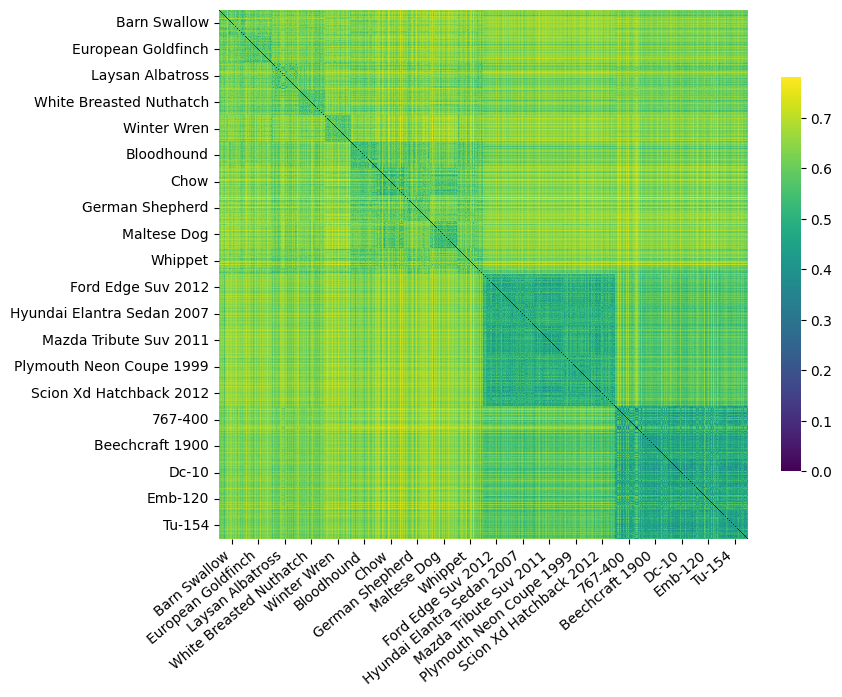

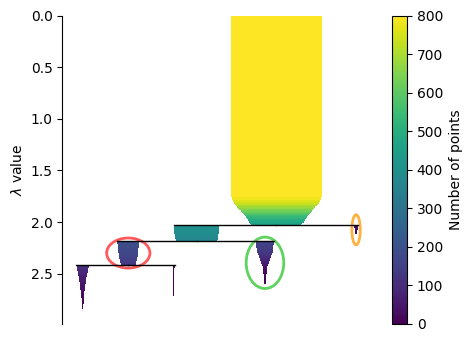

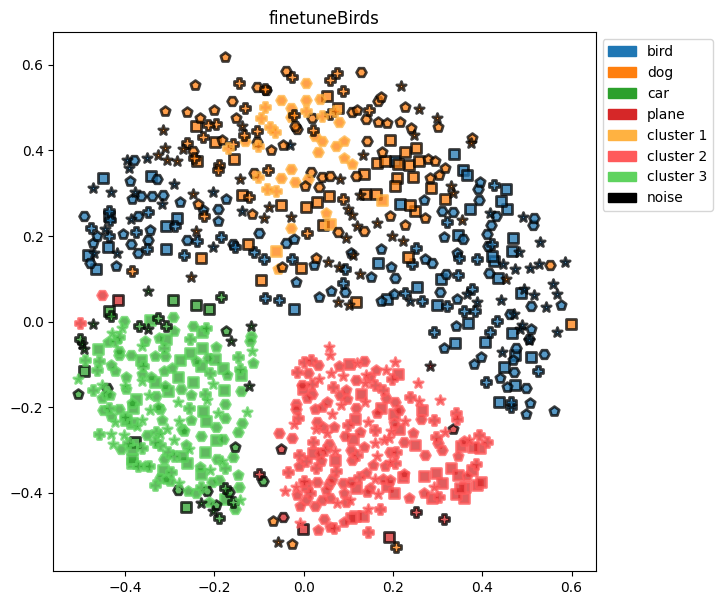

In [50]:
_ = analyze_structure(
    1 - finetuneBirdsSimMat,
    imgInfo,
    "finetuneBirds",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

Optimal cut for super level is at 1.942619080425965 with 1 clusters and a npARI of 0.115.
Optimal cut for basic level is at 1.942619080425965 with 1 clusters and a npARI of 0.115.
Optimal cut for sub level is at 1.942619080425965 with 1 clusters and a npARI of 0.0.
Loading MDS
sub: 0.045952148735523224
    bird: 0.045952148735523224
        Barn Swallow: 0.01830849051475525
        European Goldfinch: 0.0389900766313076
        Laysan Albatross: 0.03760664537549019
        White Breasted Nuthatch: 0.05666122958064079
        Winter Wren: 0.07819429785013199


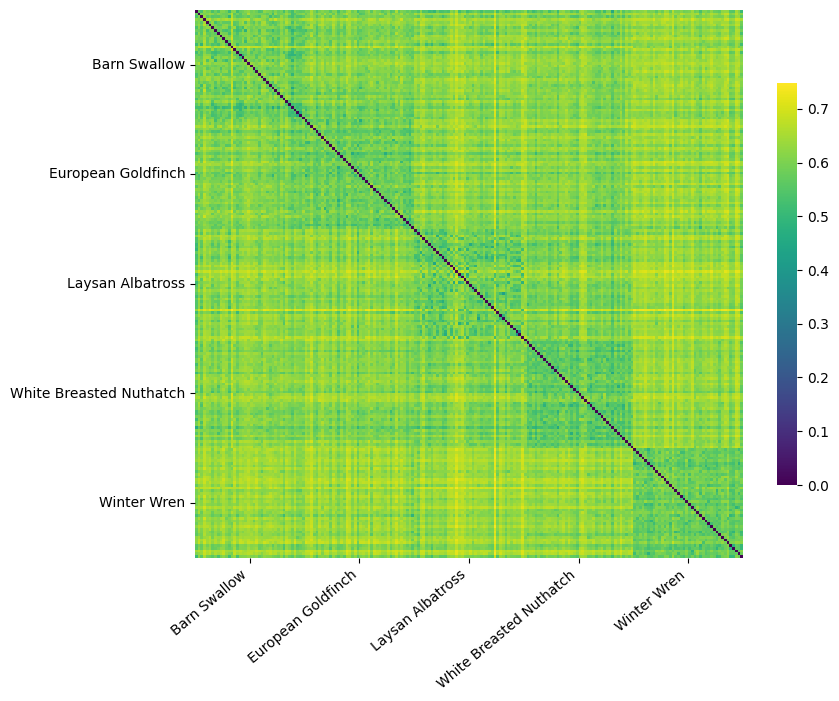

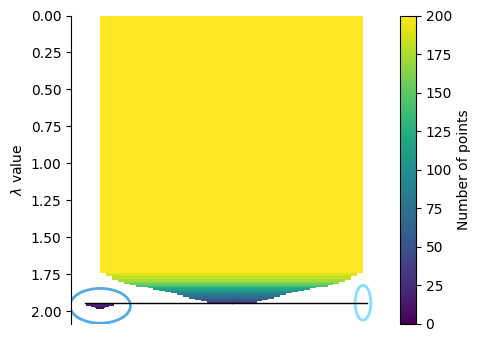

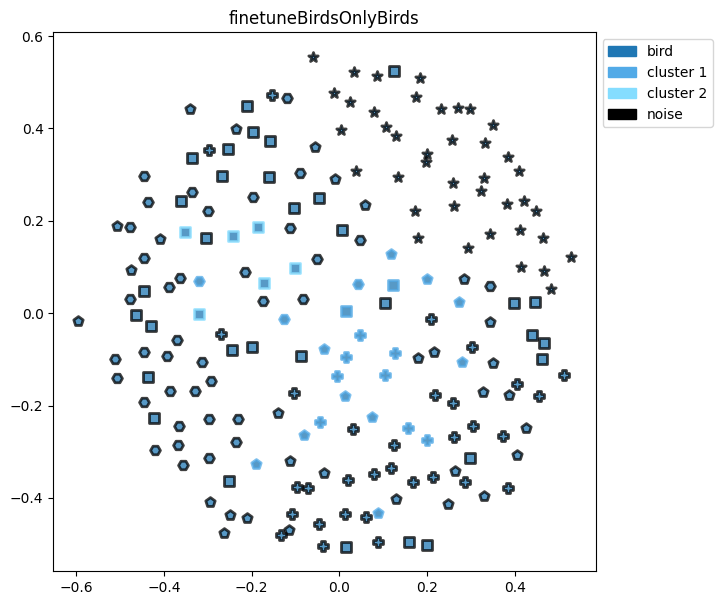

In [51]:
onlyBirdsImgInfo = imgInfo.loc[imgInfo["basic"] == "bird"]
onlyBirdsFinetuneBirdsDistMat = (
    1 - finetuneBirdsSimMat[np.ix_(onlyBirdsImgInfo.index, onlyBirdsImgInfo.index)]
)

_ = analyze_structure(
    onlyBirdsFinetuneBirdsDistMat,
    onlyBirdsImgInfo,
    "finetuneBirdsOnlyBirds",
    overwrite=overwrite,
)

In [52]:
# Cleaup reps
del birdExpertReps
del birdExpertFreezeReps
del finetuneBirdsReps

# Reanalyze with car expert


In [53]:
# Load training data
carTrainingData = pd.read_csv("./twoHotOnlyCars.csv")
# Add model type column
carTrainingData["Freeze Basic"] = False

tmp = pd.read_csv("./twoHotFreezeBasicOnlyCars.csv")
tmp["Freeze Basic"] = True

carTrainingData = pd.concat([carTrainingData, tmp], axis=0)

# Make epoch index from 1
carTrainingData["epoch"] = carTrainingData["epoch"] + 1

carTrainingData.head()

,epoch,accuracy,loss,sub_top1,sub_top5,top_k_categorical_accuracy,val_accuracy,val_loss,val_sub_top1,val_sub_top5,val_top_k_categorical_accuracy,Freeze Basic
0,1,0.528380,3.441099,0.010314,0.041626,0.781849,0.593251,5.335572,0.015421,0.053849,0.801661,False
1,2,0.528651,3.402437,0.010437,0.042608,0.781369,0.591292,5.334795,0.012685,0.040667,0.800254,False
2,3,0.529708,3.395523,0.012279,0.043713,0.782031,0.567976,5.420939,0.014053,0.045144,0.799536,False
3,4,0.563521,3.128086,0.013507,0.053536,0.803050,0.599045,5.054125,0.019898,0.054098,0.820452,False
4,5,0.564084,3.100932,0.015840,0.052554,0.803975,0.615546,5.019968,0.009576,0.051984,0.819735,False


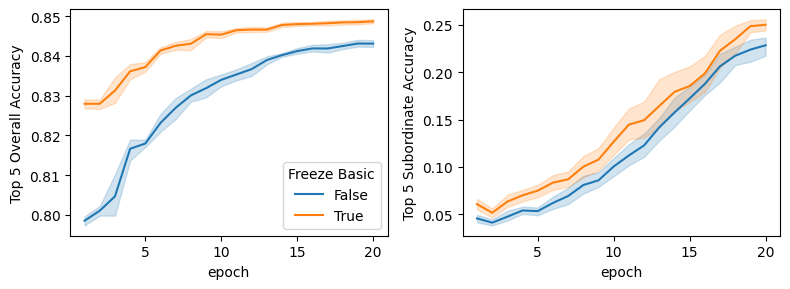

In [54]:
# Plot average accuracy
fig, ax = plt.subplots(1, 2, figsize=(8, 3))

# Plot top 5 overall accuracy
sns.lineplot(
    data=carTrainingData,
    x="epoch",
    y="val_top_k_categorical_accuracy",
    hue="Freeze Basic",
    ax=ax[0],
)

# Rename yaxis
ax[0].set_ylabel("Top 5 Overall Accuracy")


# Plot top 5 sub accuracy
sns.lineplot(
    data=carTrainingData,
    x="epoch",
    y="val_sub_top5",
    hue="Freeze Basic",
    ax=ax[1],
    legend=False,
)

# Rename yaxis
ax[1].set_ylabel("Top 5 Subordinate Accuracy")

# Tighten layout
plt.tight_layout()

fig.show()

In [55]:
carExpertReps, carExpertSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/twoHotOnlyCars",
    imgInfo,
    "carExpert",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


In [56]:
carExpertFreezeReps, carExpertFreezeSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/twoHotFreezeBasicOnlyCars",
    imgInfo,
    "carExpertFreeze",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


Optimal cut for super level is at 2.202607621735599 with 2 clusters and a npARI of 0.6925.
Optimal cut for basic level is at 2.337079177584945 with 3 clusters and a npARI of 0.4900074531953729.
Optimal cut for sub level is at 2.337079177584945 with 3 clusters and a npARI of 0.10800347814670225.
Loading MDS
super: 0.15098324418067932
    animal: 0.14218515157699585
    vehicle: 0.1597813367843628
basic: 0.15018683671951294
    animal: 0.07552613317966461
        bird: 0.08817148953676224
        dog: 0.06288077682256699
    vehicle: 0.22484757006168365
        car: 0.22341212630271912
        plane: 0.2262830138206482
sub: 0.012837287969887257
    bird: 0.028097648173570633
        Barn Swallow: 0.004472441039979458
        European Goldfinch: 0.03853289410471916
        Laysan Albatross: 0.0022222264669835567
        White Breasted Nuthatch: 0.04373360797762871
        Winter Wren: 0.05152706056833267
    dog: 0.027470877394080162
        Bloodhound: 0.046425700187683105
        Chow: 

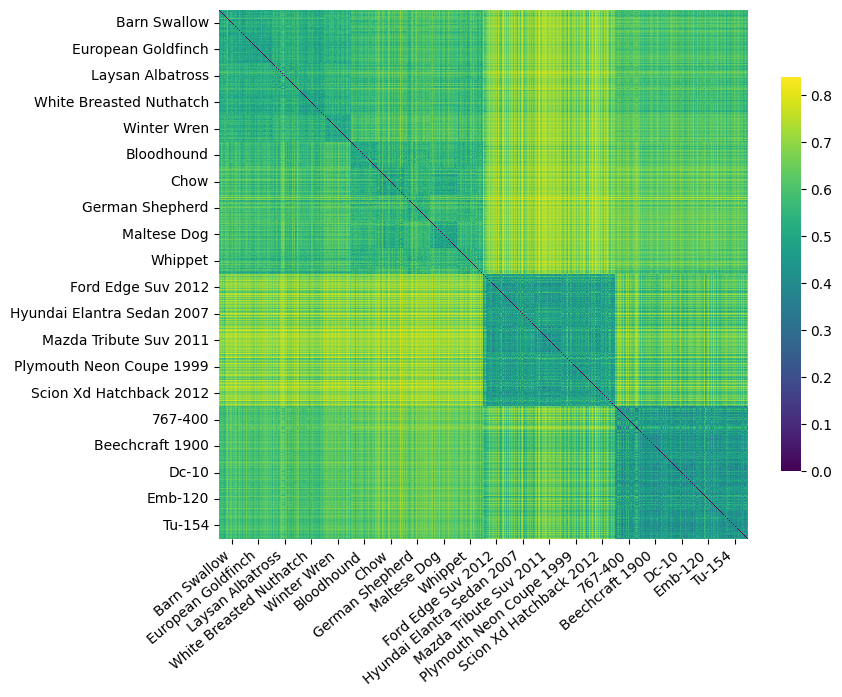

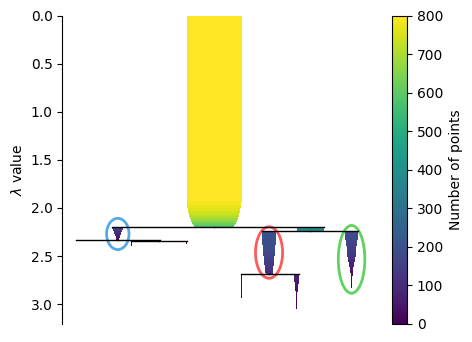

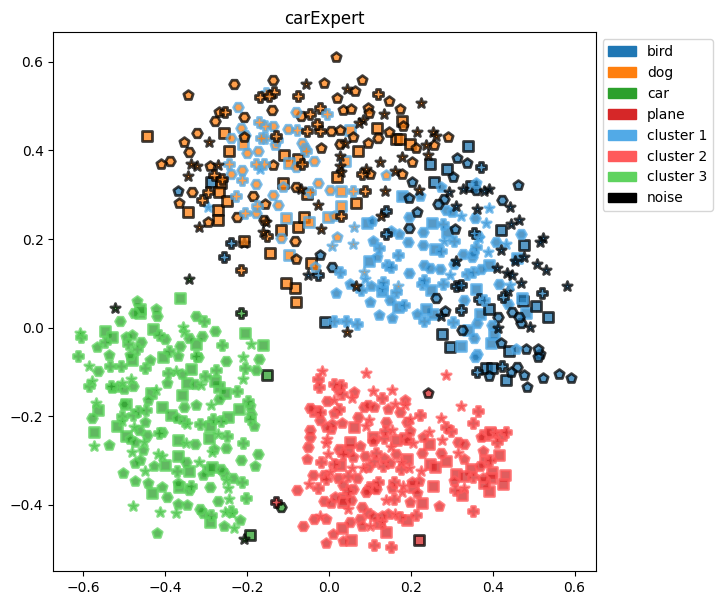

In [57]:
_ = analyze_structure(
    1 - carExpertSimMat,
    imgInfo,
    "carExpert",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

Optimal cut for super level is at 2.1695117245488786 with 2 clusters and a npARI of 0.71375.
Optimal cut for basic level is at 2.2210846357783174 with 3 clusters and a npARI of 0.588216281379331.
Optimal cut for sub level is at 2.2210846357783174 with 3 clusters and a npARI of 0.14175331234520808.
Loading MDS
super: 0.14554692804813385
    animal: 0.13806916773319244
    vehicle: 0.15302468836307526
basic: 0.1404065191745758
    animal: 0.06822556257247925
        bird: 0.08433122932910919
        dog: 0.0521199032664299
    vehicle: 0.21258747577667236
        car: 0.2104109227657318
        plane: 0.21476402878761292
sub: 0.012434745207428932
    bird: 0.027565523982048035
        Barn Swallow: 0.006625089794397354
        European Goldfinch: 0.03715096786618233
        Laysan Albatross: 0.0009095497662201524
        White Breasted Nuthatch: 0.045502740889787674
        Winter Wren: 0.04763927310705185
    dog: 0.025410791859030724
        Bloodhound: 0.04501623660326004
        Chow

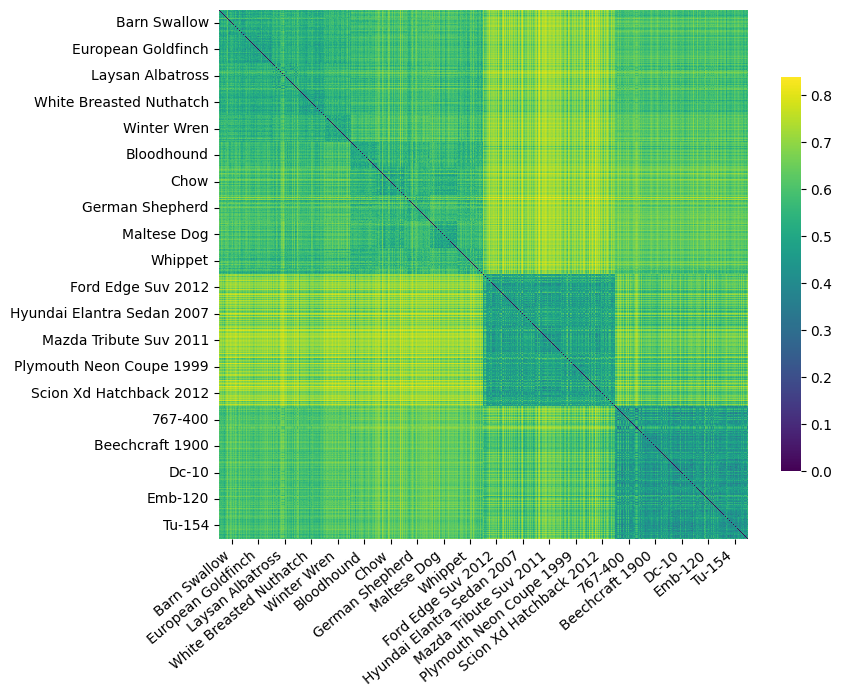

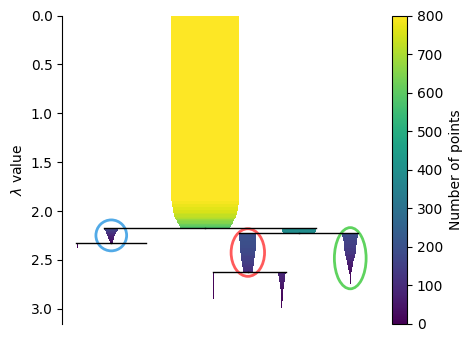

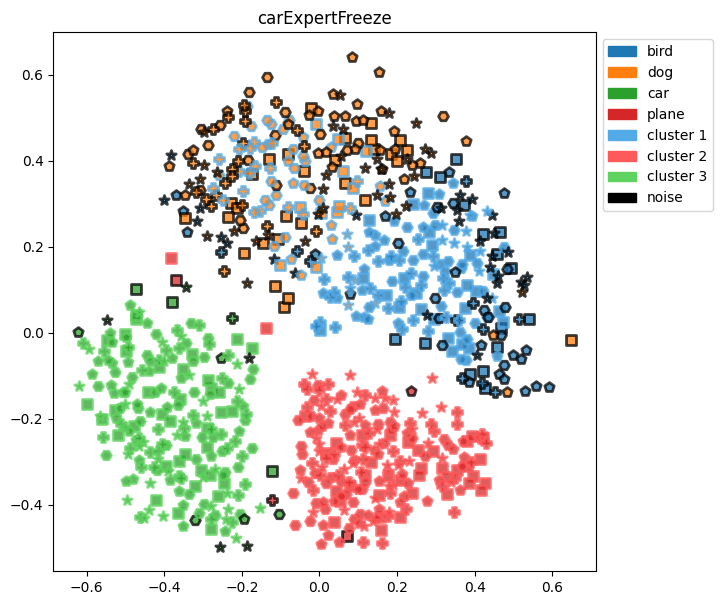

In [58]:
_ = analyze_structure(
    1 - carExpertFreezeSimMat,
    imgInfo,
    "carExpertFreeze",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

In [59]:
carExpertPerf = do_categorization(
    carExpertReps,
    rng,
    imgInfo,
    "carExpert",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 9, "b": 0, "A": 25, "B": 25},
    overwrite=overwrite,
)

Loading performance from file
{'c': 9, 'b': 0, 'A': 25, 'B': 25}
Accuracy
          mean       std
level                   
super  0.99975  0.000791
basic  0.98850  0.003575
sub    0.83975  0.015521
RT
             mean        std
level                       
super  226.225458  15.388027
basic  240.505603  32.232893
sub    313.123808  19.128177
Category Accuracy
                              mean       std
category                                    
animal                      0.9995  0.001581
vehicle                     1.0000  0.000000
bird                        0.9980  0.006325
dog                         0.9570  0.011595
car                         0.9990  0.003162
plane                       1.0000  0.000000
Barn Swallow                0.9200  0.053748
European Goldfinch          1.0000  0.000000
Laysan Albatross            0.8350  0.094428
White Breasted Nuthatch     1.0000  0.000000
Winter Wren                 0.9700  0.034960
Bloodhound                  0.9950  0.015811
Chow 

In [60]:
_ = do_categorization(
    carExpertFreezeReps,
    rng,
    imgInfo,
    "carExpertFreeze",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 9, "b": 0, "A": 25, "B": 25},
    overwrite=overwrite,
)

Loading performance from file
{'c': 9, 'b': 0, 'A': 25, 'B': 25}
Accuracy
          mean       std
level                   
super  0.99975  0.000791
basic  0.98525  0.008535
sub    0.84825  0.015726
RT
             mean        std
level                       
super  254.138672  13.791544
basic  289.643894  38.179201
sub    352.776661  15.929527
Category Accuracy
                              mean       std
category                                    
animal                      0.9995  0.001581
vehicle                     1.0000  0.000000
bird                        0.9980  0.004216
dog                         0.9440  0.032728
car                         0.9990  0.003162
plane                       1.0000  0.000000
Barn Swallow                0.9550  0.036893
European Goldfinch          1.0000  0.000000
Laysan Albatross            0.8250  0.095015
White Breasted Nuthatch     1.0000  0.000000
Winter Wren                 0.9400  0.051640
Bloodhound                  1.0000  0.000000
Chow 

In [61]:
# Performance only for cars
cars = [
    "car",
    "Ford Edge Suv 2012",
    "Hyundai Elantra Sedan 2007",
    "Mazda Tribute Suv 2011",
    "Plymouth Neon Coupe 1999",
    "Scion Xd Hatchback 2012",
]
carPerformance = carExpertPerf.loc[
    [category in cars for category in carExpertPerf["category"]]
]

perfAccSummary = (
    carPerformance.groupby(["model", "seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)
perfRTSummary = (
    carPerformance.groupby(["model", "seed", "level"])["RT"]
    .agg("mean")
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)

print(perfAccSummary)
print(perfRTSummary)

                  mean       std
model     level                 
carExpert super    NaN       NaN
          basic  0.999  0.003162
          sub    0.722  0.040222
                       mean        std
model     level                       
carExpert super         NaN        NaN
          basic   82.603774   9.177781
          sub    268.509345  25.509956

                       mean        std
model     level                       
carExpert super         NaN        NaN
          basic   82.603774   9.177781
          sub    268.509345  25.509956


In [62]:
# Load training data
finetuneCarsTrainingData = pd.read_csv("./finetuneCars.csv")

# Make epoch index from 1
finetuneCarsTrainingData["epoch"] = finetuneCarsTrainingData["epoch"] + 1

finetuneCarsTrainingData.head()

,epoch,accuracy,loss,top_k_categorical_accuracy,val_accuracy,val_loss,val_top_k_categorical_accuracy
0,1,0.054150,6.738559,0.156189,0.119512,6.126480,0.284417
1,2,0.193026,5.563725,0.413310,0.195125,5.578711,0.408158
2,3,0.316306,4.803599,0.594794,0.222485,5.360839,0.472329
3,4,0.413433,4.277822,0.698551,0.260664,5.210763,0.513120
4,5,0.504298,3.871018,0.787082,0.276707,5.121710,0.553165


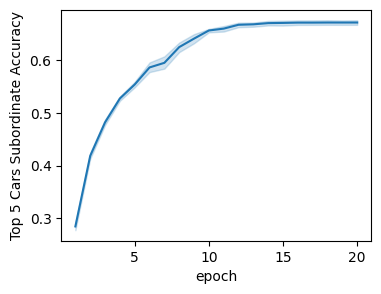

In [63]:
# Plot average accuracy over epochs
fig, ax = plt.subplots(1, 1, figsize=(4, 3))

# Plot top 5 accuracy
sns.lineplot(
    data=finetuneCarsTrainingData, x="epoch", y="val_top_k_categorical_accuracy", ax=ax
)

# Rename yaxis
ax.set_ylabel("Top 5 Cars Subordinate Accuracy")

fig.show()

In [64]:
finetuneCarsReps, finetuneCarsSimMat = make_sim_matrix(
    "./models/deepCats/AlexNet/finetuneCars",
    imgInfo,
    "finetuneCars",
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


Optimal cut for super level is at 2.2646647200096757 with 3 clusters and a npARI of 0.08370524612514668.
Optimal cut for basic level is at 2.2646647200096757 with 3 clusters and a npARI of 0.09326317698348667.
Optimal cut for sub level is at 2.2903179920270604 with 4 clusters and a npARI of 0.031046644588644305.
Loading MDS
super: 0.0749136358499527
    animal: 0.13296176493167877
    vehicle: 0.016865504905581474
basic: 0.06597931683063507
    animal: 0.06221572682261467
        bird: 0.06966540962457657
        dog: 0.05476604402065277
    vehicle: 0.06974290311336517
        car: 0.018061496317386627
        plane: 0.12142430990934372
sub: 0.016330767422914505
    bird: 0.030353670939803123
        Barn Swallow: 0.017774548381567
        European Goldfinch: 0.038414936512708664
        Laysan Albatross: 0.023020625114440918
        White Breasted Nuthatch: 0.008286280557513237
        Winter Wren: 0.0642719566822052
    dog: 0.026070628315210342
        Bloodhound: 0.033755596727132

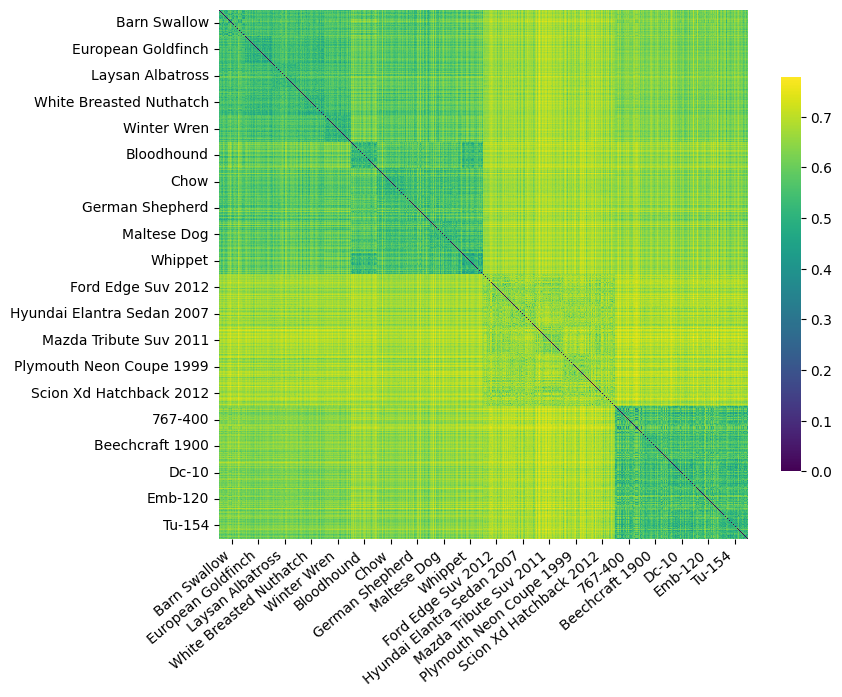

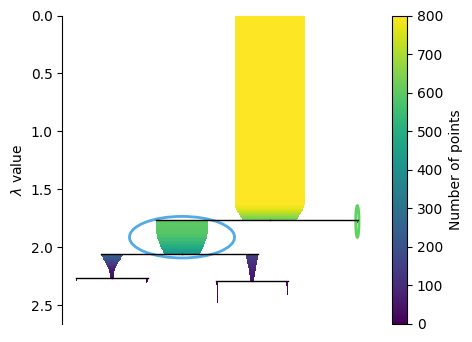

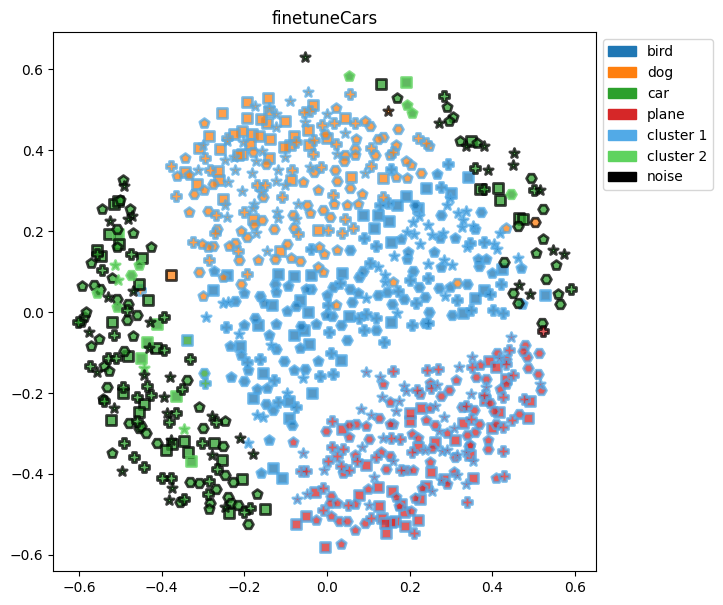

In [65]:
_ = analyze_structure(
    1 - finetuneCarsSimMat,
    imgInfo,
    "finetuneCars",
    procrustesTarget=ecosetSolution,
    overwrite=overwrite,
)

In [66]:
finetuneCarsPerf = do_categorization(
    finetuneCarsReps,
    rng,
    imgInfo,
    "finetuneCars",
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 10, "b": 0, "A": 10, "B": 10},
    overwrite=overwrite,
)

Loading performance from file
{'c': 10, 'b': 0, 'A': 10, 'B': 10}
Accuracy
          mean       std
level                   
super  0.93900  0.013134
basic  0.96050  0.007341
sub    0.87275  0.019129
RT
             mean        std
level                       
super  299.034458  48.689395
basic  151.064359  17.873389
sub    158.253184  18.035881
Category Accuracy
                             mean       std
category                                   
animal                      1.000  0.000000
vehicle                     0.878  0.026268
bird                        0.968  0.014757
dog                         0.960  0.018257
car                         0.914  0.025033
plane                       1.000  0.000000
Barn Swallow                0.910  0.065828
European Goldfinch          0.990  0.021082
Laysan Albatross            0.980  0.025820
White Breasted Nuthatch     0.910  0.073786
Winter Wren                 0.975  0.035355
Bloodhound                  0.945  0.036893
Chow              

In [67]:
# Performance only for cars
cars = [
    "car",
    "Ford Edge Suv 2012",
    "Hyundai Elantra Sedan 2007",
    "Mazda Tribute Suv 2011",
    "Plymouth Neon Coupe 1999",
    "Scion Xd Hatchback 2012",
]
carPerformance = finetuneCarsPerf.loc[
    [category in cars for category in finetuneCarsPerf["category"]]
]

carAccSummary = (
    carPerformance.groupby(["model", "seed", "level"])["response"]
    .agg(lambda x: np.mean(x == "yes"))
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)
carRTSummary = (
    carPerformance.groupby(["model", "seed", "level"])["RT"]
    .agg("mean")
    .groupby(["model", "level"])
    .agg(["mean", "std"])
)

print(carAccSummary)
print(carRTSummary)

                     mean       std
model        level                 
finetuneCars super    NaN       NaN
             basic  0.914  0.025033
             sub    0.840  0.028284
                          mean        std
model        level                       
finetuneCars super         NaN        NaN
             basic  494.384094  64.723437
             sub    509.042704  62.880771


Optimal cut for super level is at 1.7608931623815005 with 2 clusters and a npARI of 0.0.
Optimal cut for basic level is at 1.7608931623815005 with 2 clusters and a npARI of 0.0.
Optimal cut for sub level is at 1.7608931623815005 with 2 clusters and a npARI of 0.02039442883895131.
Loading MDS
sub: 0.011159580200910568
    car: 0.011159580200910568
        Ford Edge Suv 2012: 0.013240868225693703
        Hyundai Elantra Sedan 2007: 0.013302480801939964
        Mazda Tribute Suv 2011: 0.019246960058808327
        Plymouth Neon Coupe 1999: 0.02067711018025875
        Scion Xd Hatchback 2012: -0.010669519193470478


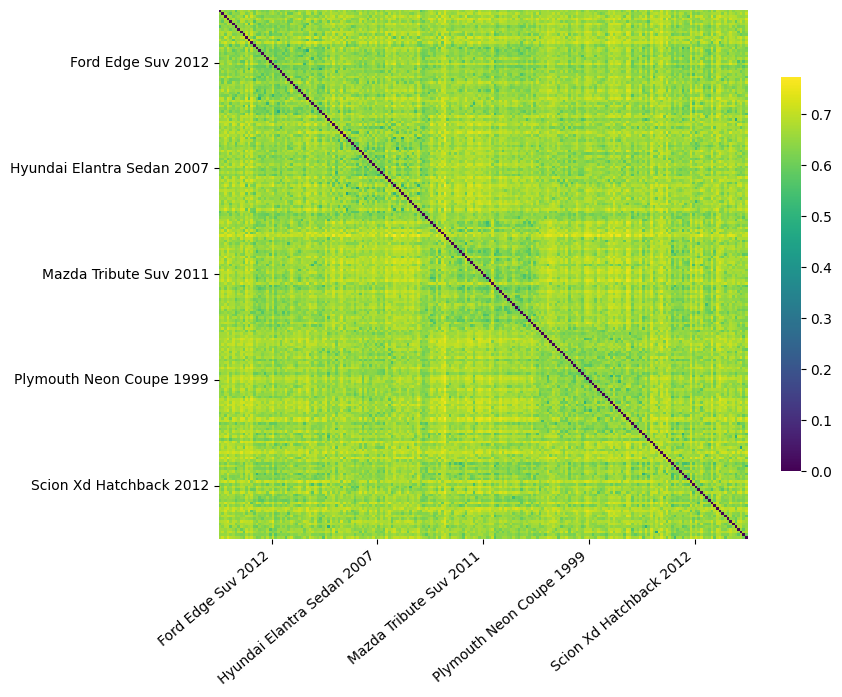

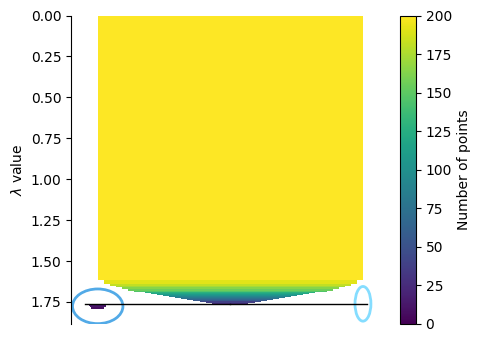

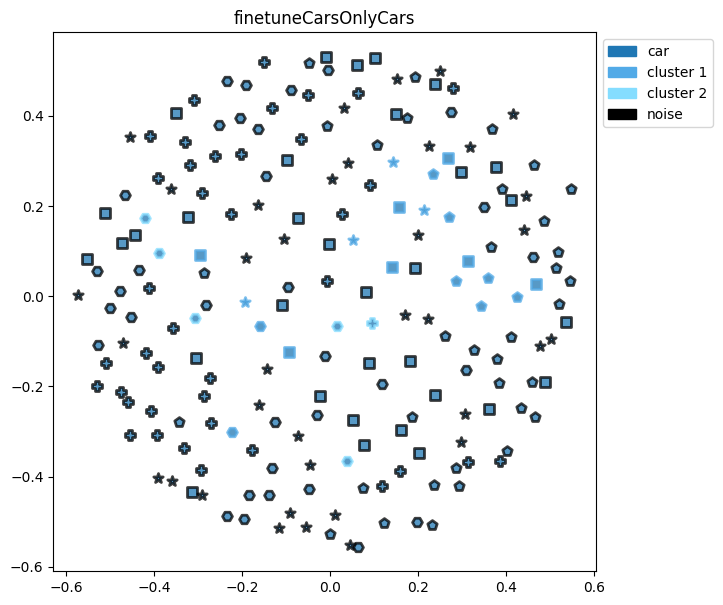

In [68]:
onlyCarsImgInfo = imgInfo.loc[imgInfo["basic"] == "car"]
onlyCarsFinetuneCarsDistMat = (
    1 - finetuneCarsSimMat[np.ix_(onlyCarsImgInfo.index, onlyCarsImgInfo.index)]
)

_ = analyze_structure(
    onlyCarsFinetuneCarsDistMat,
    onlyCarsImgInfo,
    "finetuneCarsOnlyCars",
    overwrite=overwrite,
)

# Maniuplate category separation of real images by choosing different categories


In [69]:
name = "lowSep"
imgInfoFile = "./lowSepImgInfo.csv"

altImgInfo = pd.read_csv(imgInfoFile)

altReps, altSimMat = make_sim_matrix(
    modelDir="./models/AlexNet/ecoset_training_seeds_01_to_10/",
    imgInfo=altImgInfo,
    name=name,
    overwrite=overwrite,
)

Loading images


2024-05-29 16:02:29.687442: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-29 16:02:29.793130: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-29 16:02:29.794311: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-05-29 16:02:29.812480: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorF

Making representations


2024-05-29 16:02:40.060939: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 104857600 exceeds 10% of free system memory.
2024-05-29 16:02:40.290688: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 67108864 exceeds 10% of free system memory.
2024-05-29 16:02:40.477874: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 481689600 exceeds 10% of free system memory.


Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_01/model.ckpt_epoch89 loaded successfully.


2024-05-29 16:02:40.795820: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 481689600 exceeds 10% of free system memory.
2024-05-29 16:02:42.722807: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:428] Loaded cuDNN version 8202
2024-05-29 16:02:44.432171: I tensorflow/tsl/platform/default/subprocess.cc:304] Start cannot spawn child process: No such file or directory
2024-05-29 16:02:47.132585: W tensorflow/tsl/framework/bfc_allocator.cc:290] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.38GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


25/25 [==============================] - 8s 48ms/step


2024-05-29 16:02:48.588618: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 327680000 exceeds 10% of free system memory.


Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_02/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_03/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_04/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_05/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_06/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_07/model.ckpt_epoch89 loaded successfully.
25/25 [===============

Optimal cut for super level is at 2.719503600130973 with 3 clusters and a npARI of 0.603978055096277.
Optimal cut for basic level is at 2.810635278823425 with 4 clusters and a npARI of 0.51.
Optimal cut for sub level is at 2.810635278823425 with 4 clusters and a npARI of 0.11607672237156166.
Calculating MDS
8612.71693924609
super: 0.10681360214948654
    animal: 0.07657264918088913
    vehicle: 0.13705456256866455
basic: 0.12385207414627075
    animal: 0.09515717625617981
        bird: 0.11419923603534698
        dog: 0.07611512392759323
    vehicle: 0.1525469720363617
        car: 0.16764633357524872
        plane: 0.13744759559631348
sub: 0.001087226439267397
    bird: 0.002723735524341464
        CUB_043.Yellow_bellied_Flycatcher: 0.0013706644531339407
        CUB_156.White_eyed_Vireo: 2.414854316157289e-05
        CUB_173.Orange_crowned_Warbler: -0.014645909890532494
        CUB_176.Prairie_Warbler: 0.023572886362671852
        CUB_179.Tennessee_Warbler: 0.0032968882005661726
    d

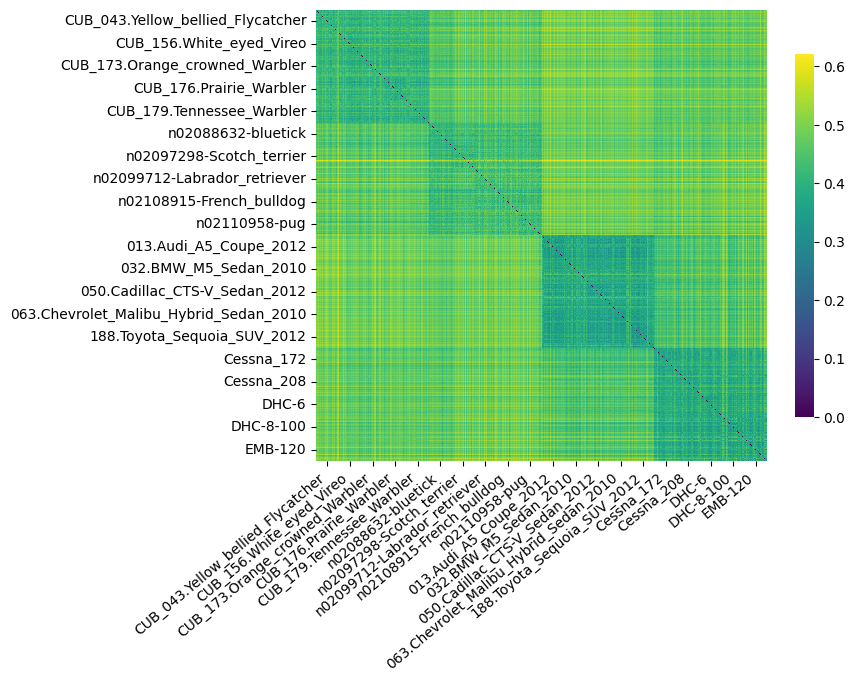

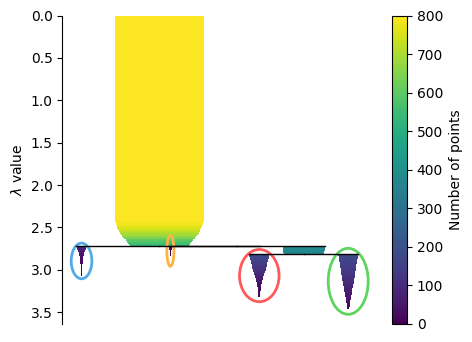

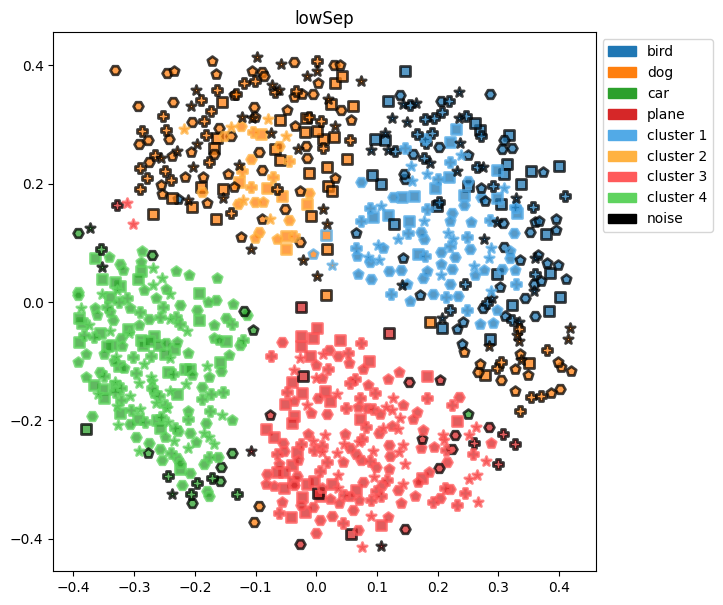

In [70]:
_ = analyze_structure(
    distMat=1 - altSimMat,
    procrustesTarget=ecosetSolution,
    name=name,
    imgInfo=altImgInfo,
    overwrite=overwrite,
)

In [71]:
_ = do_categorization(
    reps=altReps,
    rng=rng,
    imgInfo=altImgInfo,
    name=name,
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 13, "b": 0, "A": 30, "B": 30},
    overwrite=overwrite,
)

Simulating task
{'c': 13, 'b': 0, 'A': 30, 'B': 30}
Accuracy
          mean       std
level                   
super  0.99750  0.001667
basic  0.99875  0.002430
sub    0.74600  0.028534
RT
              mean        std
level                        
super   520.159810  35.827635
basic   361.636683  11.482819
sub    1371.812890  92.599029
Category Accuracy
                                          mean       std
category                                                
animal                                  0.9955  0.003689
vehicle                                 0.9995  0.001581
bird                                    0.9990  0.003162
dog                                     0.9980  0.006325
car                                     0.9990  0.003162
plane                                   0.9990  0.003162
CUB_043.Yellow_bellied_Flycatcher       0.8050  0.076194
CUB_156.White_eyed_Vireo                0.6150  0.145392
CUB_173.Orange_crowned_Warbler          0.7450  0.146154
CUB_176.Prairie_

In [72]:
name = "midSep"
imgInfoFile = "./midSepImgInfo.csv"
overwrite = True

altImgInfo = pd.read_csv(imgInfoFile)

altReps, altSimMat = make_sim_matrix(
    modelDir="./models/AlexNet/ecoset_training_seeds_01_to_10/",
    imgInfo=altImgInfo,
    name=name,
    overwrite=overwrite,
)

Loading images
Making representations
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_01/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 51ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_02/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_03/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 49ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_04/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_05/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 48ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_06/model.ckpt_epoch89 loade

Optimal cut for super level is at 2.7450527266840004 with 2 clusters and a npARI of 0.51375.
Optimal cut for basic level is at 3.0493927284452313 with 2 clusters and a npARI of 0.27.
Optimal cut for sub level is at 3.0493927284452313 with 2 clusters and a npARI of 0.05226154224528876.
Calculating MDS
8736.775159170411
super: 0.10091086477041245
    animal: 0.08216860890388489
    vehicle: 0.11965312063694
basic: 0.1132599338889122
    animal: 0.061389148235321045
        bird: 0.07203080505132675
        dog: 0.05074749141931534
    vehicle: 0.16513071954250336
        car: 0.16592378914356232
        plane: 0.1643376499414444
sub: 0.017445553094148636
    bird: 0.02679731510579586
        CUB_024.Red_faced_Cormorant: 0.058941442519426346
        CUB_049.Boat_tailed_Grackle: 0.005857239942997694
        CUB_056.Pine_Grosbeak: -0.007540762424468994
        CUB_094.White_breasted_Nuthatch: 0.034419603645801544
        CUB_158.Bay_breasted_Warbler: 0.042309049516916275
    dog: 0.02036304

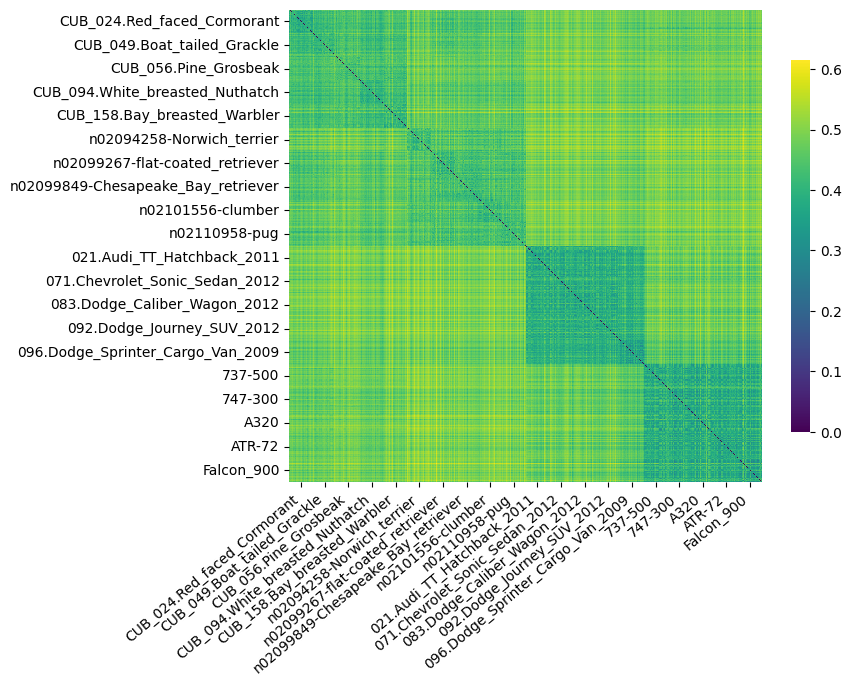

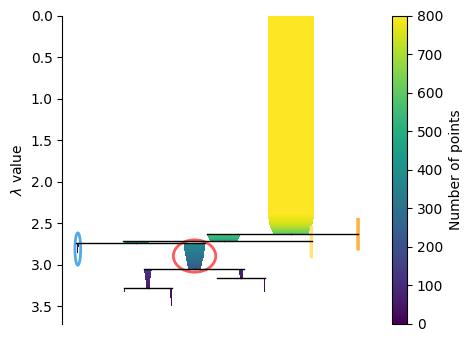

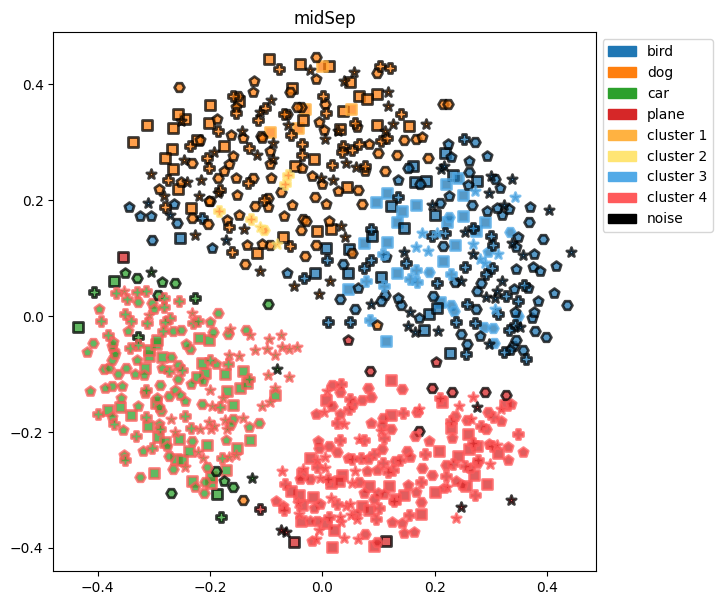

In [73]:
_ = analyze_structure(
    distMat=1 - altSimMat,
    procrustesTarget=ecosetSolution,
    name=name,
    imgInfo=altImgInfo,
    overwrite=overwrite,
)

In [74]:
_ = do_categorization(
    reps=altReps,
    rng=rng,
    imgInfo=altImgInfo,
    name=name,
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 13, "b": 0, "A": 30, "B": 30},
    overwrite=overwrite,
)

Simulating task
{'c': 13, 'b': 0, 'A': 30, 'B': 30}
Accuracy
          mean       std
level                   
super  0.99725  0.001845
basic  0.99075  0.003545
sub    0.85675  0.019581
RT
             mean        std
level                       
super  549.324285  36.119619
basic  542.585633  54.977844
sub    927.829053  36.547104
Category Accuracy
                                      mean       std
category                                            
animal                              0.9965  0.004116
vehicle                             0.9980  0.002582
bird                                1.0000  0.000000
dog                                 0.9630  0.014181
car                                 1.0000  0.000000
plane                               1.0000  0.000000
CUB_024.Red_faced_Cormorant         0.9950  0.015811
CUB_049.Boat_tailed_Grackle         0.9250  0.035355
CUB_056.Pine_Grosbeak               0.8750  0.085797
CUB_094.White_breasted_Nuthatch     1.0000  0.000000
CUB_158.Bay_

In [75]:
name = "highSep"
imgInfoFile = "./highSepImgInfo.csv"

altImgInfo = pd.read_csv(imgInfoFile)

altReps, altSimMat = make_sim_matrix(
    modelDir="./models/AlexNet/ecoset_training_seeds_01_to_10/",
    imgInfo=altImgInfo,
    name=name,
    overwrite=overwrite,
)

Loading images
Making representations
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_01/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 49ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_02/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 49ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_03/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_04/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_05/model.ckpt_epoch89 loaded successfully.
25/25 [==============================] - 1s 50ms/step
Weights from ./models/AlexNet/ecoset_training_seeds_01_to_10/training_seed_06/model.ckpt_epoch89 loade

Optimal cut for super level is at 2.6959627284777703 with 5 clusters and a npARI of 0.5713377946815629.
Optimal cut for basic level is at 2.83334307210349 with 7 clusters and a npARI of 0.3776408189271538.
Optimal cut for sub level is at 2.83334307210349 with 7 clusters and a npARI of 0.1038071456262269.
Calculating MDS
9311.511400158792
super: 0.08821909129619598
    animal: 0.061646074056625366
    vehicle: 0.114792101085186
basic: 0.07701355963945389
    animal: 0.05506942421197891
        bird: 0.07324059307575226
        dog: 0.03689825162291527
    vehicle: 0.09895768761634827
        car: 0.0872763842344284
        plane: 0.11063899844884872
sub: 0.05334683880209923
    bird: 0.06315523386001587
        CUB_039.Least_Flycatcher: 0.02253459207713604
        CUB_063.Ivory_Gull: 0.07953751087188721
        CUB_068.Ruby_throated_Hummingbird: 0.03633807227015495
        CUB_086.Pacific_Loon: 0.10004162788391113
        CUB_123.Henslow_Sparrow: 0.07732434570789337
    dog: 0.047048777

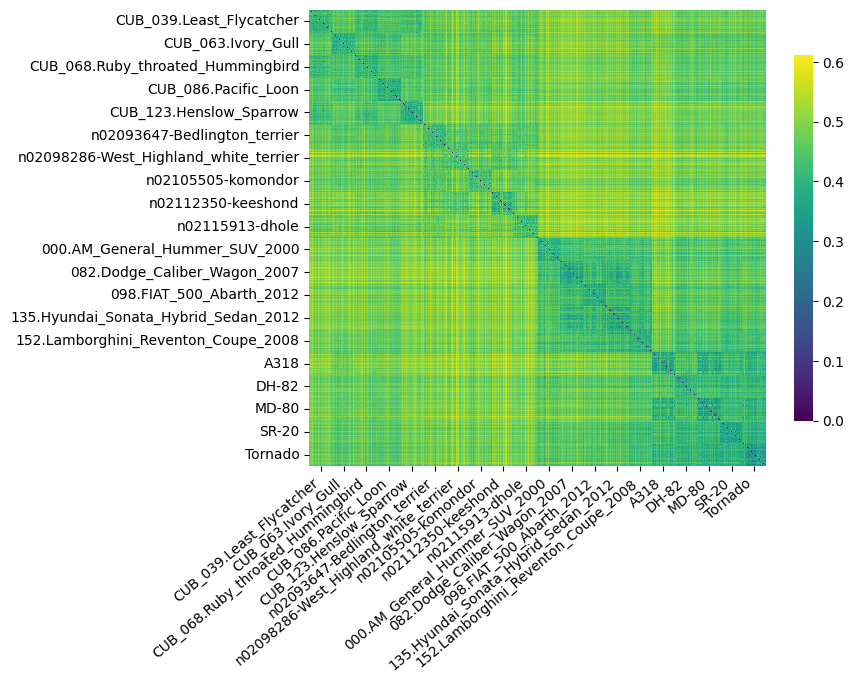

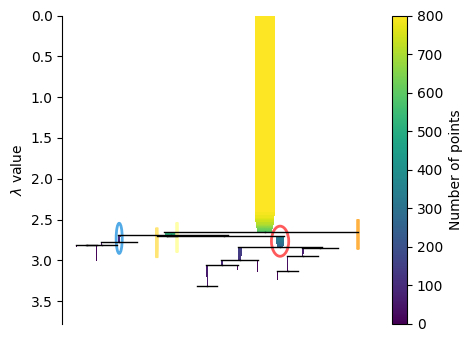

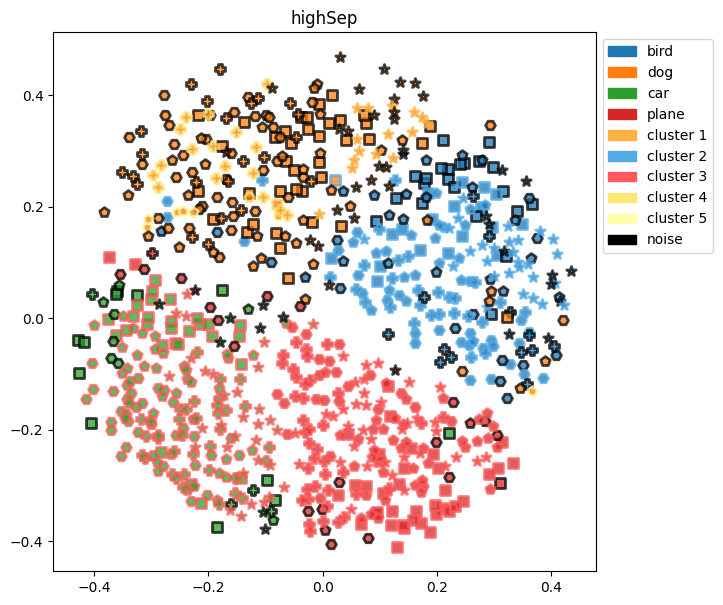

In [76]:
_ = analyze_structure(
    distMat=1 - altSimMat,
    procrustesTarget=ecosetSolution,
    name=name,
    imgInfo=altImgInfo,
    overwrite=overwrite,
)

In [77]:
_ = do_categorization(
    reps=altReps,
    rng=rng,
    imgInfo=altImgInfo,
    name=name,
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 13, "b": 0, "A": 30, "B": 30},
    overwrite=overwrite,
)

Simulating task
{'c': 13, 'b': 0, 'A': 30, 'B': 30}
Accuracy
          mean       std
level                   
super  0.99625  0.002125
basic  0.98225  0.004632
sub    0.97775  0.006061
RT
             mean        std
level                       
super  762.294076  23.352330
basic  757.355251  68.815714
sub    468.644340  28.992311
Category Accuracy
                                         mean       std
category                                               
animal                                 0.9925  0.004249
vehicle                                1.0000  0.000000
bird                                   1.0000  0.000000
dog                                    0.9630  0.021108
car                                    0.9660  0.011738
plane                                  1.0000  0.000000
CUB_039.Least_Flycatcher               1.0000  0.000000
CUB_063.Ivory_Gull                     1.0000  0.000000
CUB_068.Ruby_throated_Hummingbird      1.0000  0.000000
CUB_086.Pacific_Loon            

In [78]:
name = "highSepExpertCars"
imgInfoFile = "./highSepImgInfo.csv"
overwrite = False

altImgInfo = pd.read_csv(imgInfoFile)

altReps, altSimMat = make_sim_matrix(
    modelDir="./models/deepCats/AlexNet/finetuneCars/",
    imgInfo=altImgInfo,
    name=name,
    overwrite=overwrite,
)

Loading representations
Loading similarity matrix


Optimal cut for super level is at 2.031346037285623 with 2 clusters and a npARI of 0.54625.
Optimal cut for basic level is at 2.031346037285623 with 2 clusters and a npARI of 0.2623751956896576.
Optimal cut for sub level is at 2.2630740856196354 with 6 clusters and a npARI of 0.07884638893164446.
Loading MDS
super: 0.06333746016025543
    animal: 0.12919513881206512
    vehicle: -0.0025202175602316856
basic: 0.041366010904312134
    animal: 0.05825449526309967
        bird: 0.0751526802778244
        dog: 0.04135630652308464
    vehicle: 0.024477526545524597
        car: -0.016452642157673836
        plane: 0.06540769338607788
sub: 0.04769911617040634
    bird: 0.056951381266117096
        CUB_039.Least_Flycatcher: 0.030249077826738358
        CUB_063.Ivory_Gull: 0.07648361474275589
        CUB_068.Ruby_throated_Hummingbird: 0.029537122696638107
        CUB_086.Pacific_Loon: 0.07746990025043488
        CUB_123.Henslow_Sparrow: 0.07101718336343765
    dog: 0.04685065895318985
        n0

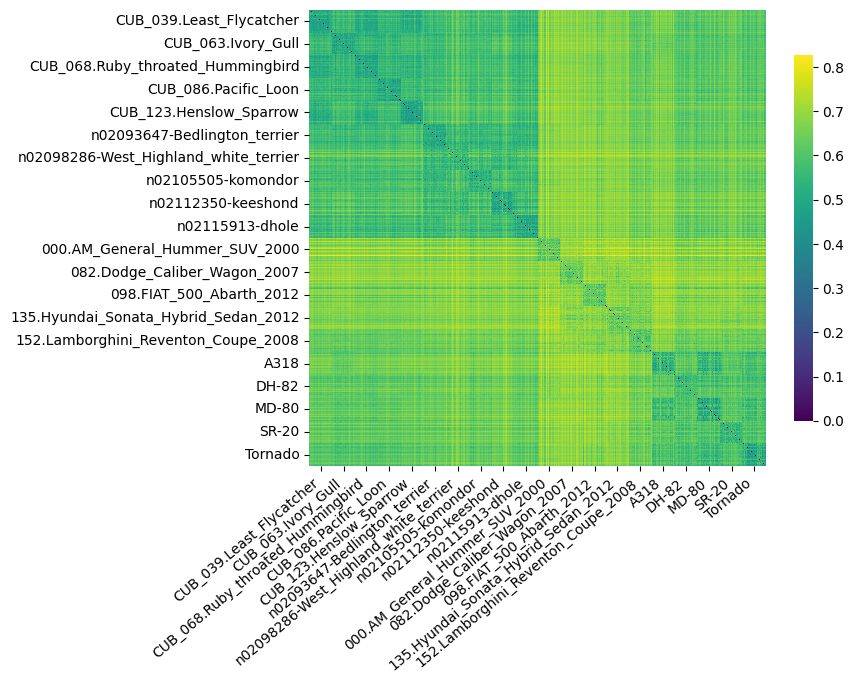

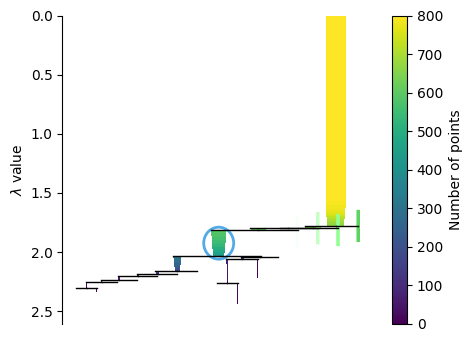

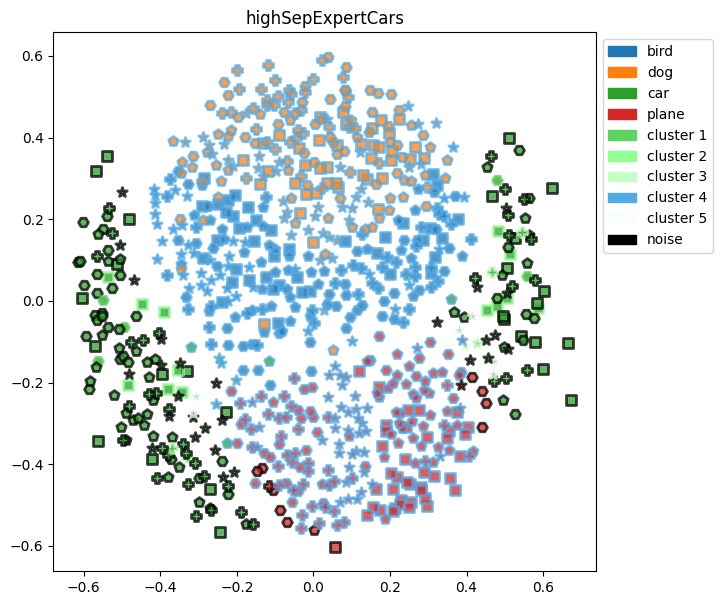

In [79]:
_ = analyze_structure(
    distMat=1 - altSimMat,
    procrustesTarget=ecosetSolution,
    name=name,
    imgInfo=altImgInfo,
    overwrite=overwrite,
)

In [80]:
_ = do_categorization(
    reps=altReps,
    rng=rng,
    imgInfo=altImgInfo,
    name=name,
    balanced=True,
    foils=True,
    ebrw_kwargs={"c": 13, "b": 0, "A": 30, "B": 30},
    overwrite=overwrite,
)

Loading performance from file
{'c': 13, 'b': 0, 'A': 30, 'B': 30}
Accuracy
         mean       std
level                  
super  0.9435  0.027518
basic  0.9645  0.006101
sub    0.9740  0.003944
RT
             mean         std
level                        
super  388.819232  313.543885
basic  129.551896   27.387863
sub     28.526615    4.537922
Category Accuracy
                                        mean       std
category                                              
animal                                 1.000  0.000000
vehicle                                0.887  0.055035
bird                                   1.000  0.000000
dog                                    0.987  0.006749
car                                    0.871  0.026437
plane                                  1.000  0.000000
CUB_039.Least_Flycatcher               1.000  0.000000
CUB_063.Ivory_Gull                     0.995  0.015811
CUB_068.Ruby_throated_Hummingbird      0.995  0.015811
CUB_086.Pacific_Loon         